In [1]:
library(tidyverse)
library(targets)
library(Seurat)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.6     ✔ purrr   0.3.4
✔ tibble  3.1.7     ✔ dplyr   1.0.9
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()

Attaching SeuratObject

Attaching sp



In [2]:
obj = qs::qread('_targets/objects/exp_neuron_obob')
obj

An object of class Seurat 
59227 features across 86815 samples within 3 assays 
Active assay: SCT (26906 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [3]:
head(obj@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,treatment,time,collection_date,isolation_date,batch,predicted.id,prediction.score.max,labels,nCount_integrated,nFeature_integrated
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<dbl>,<int>
GCAGCCACACAGCCAC_1_1,SI-TT-A11,69641,7356,SI-TT-A11,1532,12,D706,9837,3757,59804,⋯,FGF1,Day5,220329,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,0,0
TGCTTGCAGTTCCGTA_1_1,SI-TT-A11,71825,7455,SI-TT-A11,1616,12,D706,8834,3443,62991,⋯,Veh_PF,Day14,220201,22/6/2022,Batch 1,Unassigned1,0.8065577,Unassigned1,0,0
GAGGCAAGTACCTAAC_1_1,SI-TT-A11,68817,7344,SI-TT-A11,1884,12,D706,8246,3326,60571,⋯,Veh_PF,Day14,220201,22/6/2022,Batch 1,Unassigned1,0.8525726,Unassigned1,0,0
GTAATGCTCTGTCCCA_1_1,SI-TT-A11,69910,7425,SI-TT-A11,2555,12,D706,10497,3727,59413,⋯,FGF1,Day5,211213,22/6/2022,Batch 1,Hdc,1.0000000,Gm8773_Tac1-Hdc,0,0
GATCACACACCCAAGC_1_1,SI-TT-A11,62110,6862,SI-TT-A11,1728,12,D706,9451,3566,52659,⋯,Veh_PF,Day5,220329,22/6/2022,Batch 1,Unassigned1,0.6368759,Unassigned1,0,0
GGACGTCCAGGCCCTA_1_1,SI-TT-A11,63372,7265,SI-TT-A11,1778,12,D706,8563,3478,54809,⋯,Veh_PF,Day5,211214,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,0,0


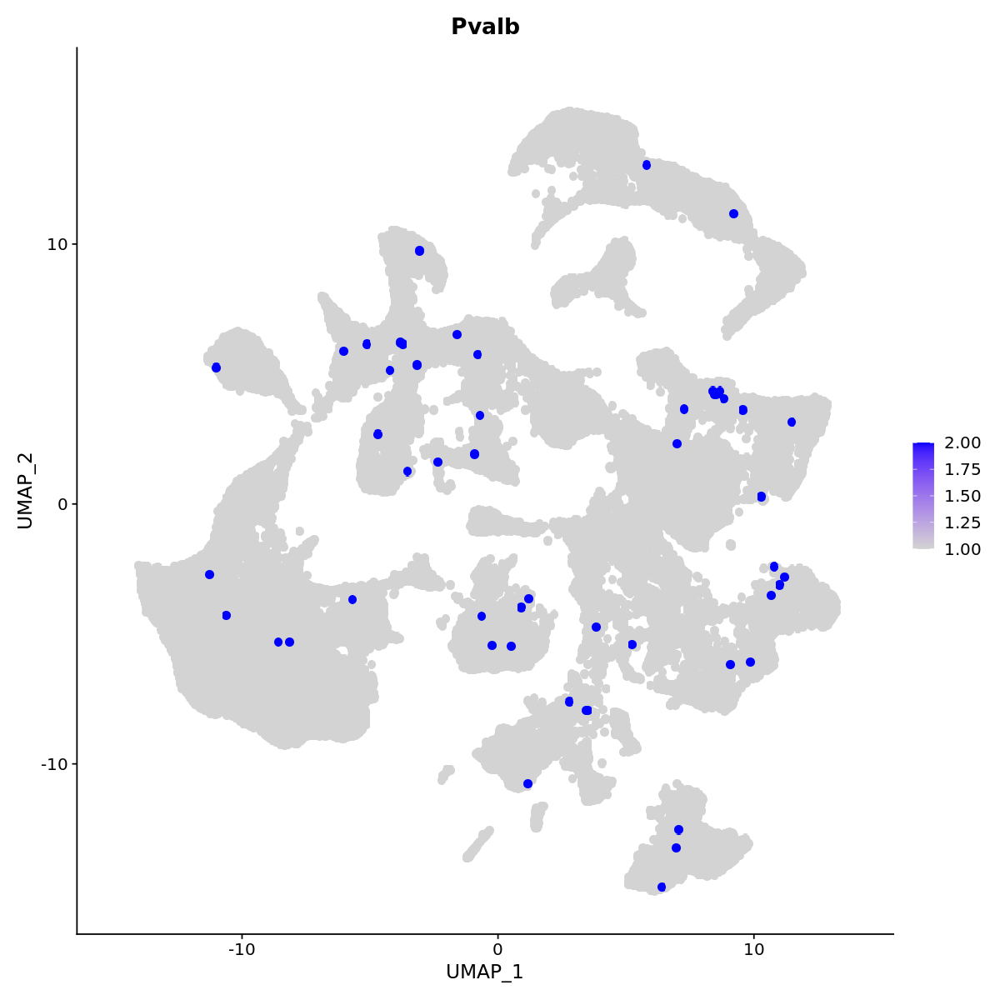

In [441]:
DefaultAssay(obj) = "RNA"
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(obj,
            features = c("Pvalb"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

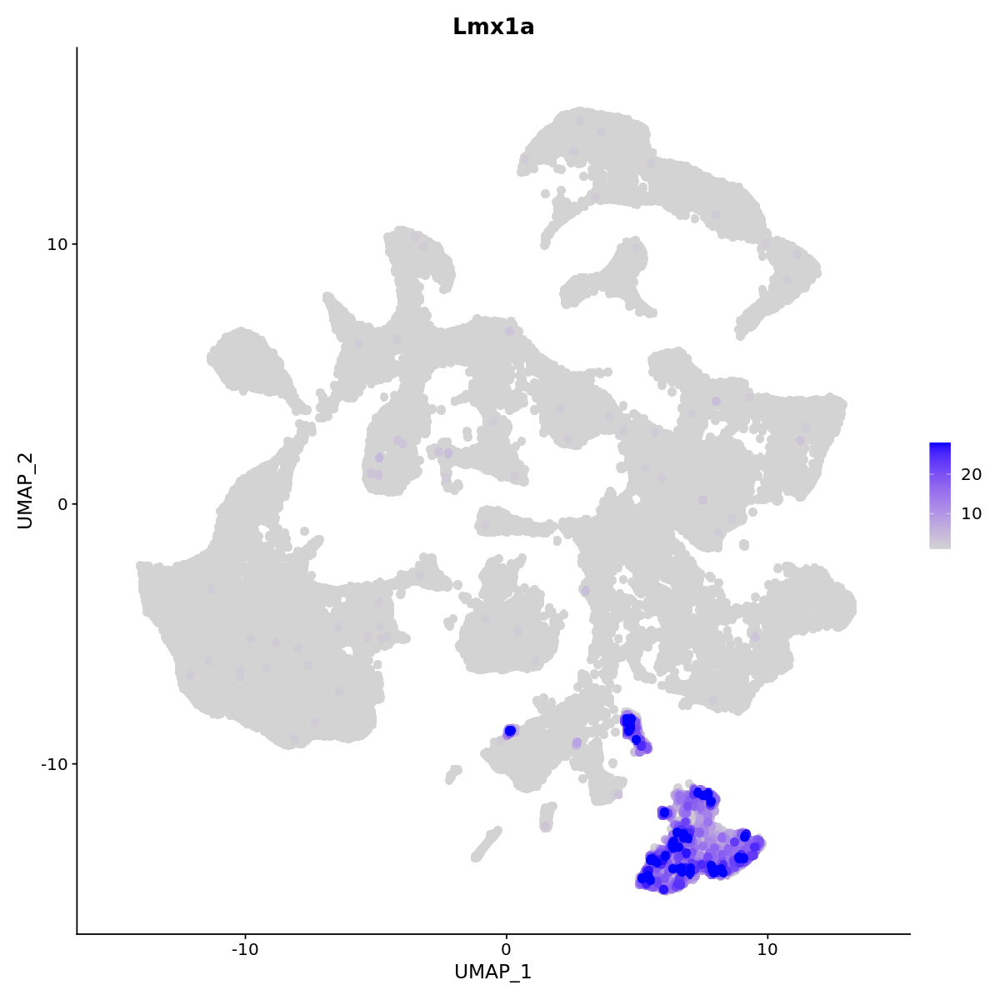

In [8]:
DefaultAssay(obj) = "RNA"
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(obj,
            features = c("Lmx1a"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

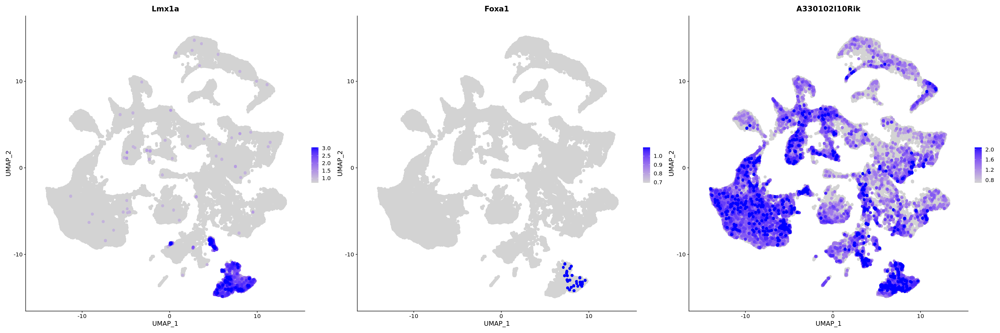

In [439]:
DefaultAssay(obj) = "SCT"
options(repr.plot.width=30, repr.plot.height=10)
fp = FeaturePlot(obj,
            features = c("Lmx1a", "Foxa1", 'A330102I10Rik'),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
                 ncol=3,
           raster.dpi=c(1024, 1024)
           )
fp

In [9]:
source('preprocessing.R')

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, 

In [12]:
campbell = load_campbell()
campbell = sc_transform_campbell(campbell)
campbell = run_sct_chaser(campbell)
campbell

snapshotDate(): 2021-10-19

see ?scRNAseq and browseVignettes('scRNAseq') for documentation

loading from cache

see ?scRNAseq and browseVignettes('scRNAseq') for documentation

loading from cache

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 21404 by 21086

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 148 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 21404 genes



  |======================================================================| 100%


Computing corrected count matrix for 21404 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 8.821955 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out batches

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.originalexp; see ?make.names for more details on syntax validity"
Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
14:10:24 UMAP embedding parameters a = 0.9922 b = 1.112

14:10:24 Read 21086 rows and found 30 numeric columns

14:10:24 Using Annoy for neighbor search, n_neighbors = 30

14:10:24 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----

An object of class Seurat 
48178 features across 21086 samples within 2 assays 
Active assay: SCT (21404 features, 3000 variable features)
 1 other assay present: originalexp
 2 dimensional reductions calculated: pca, umap

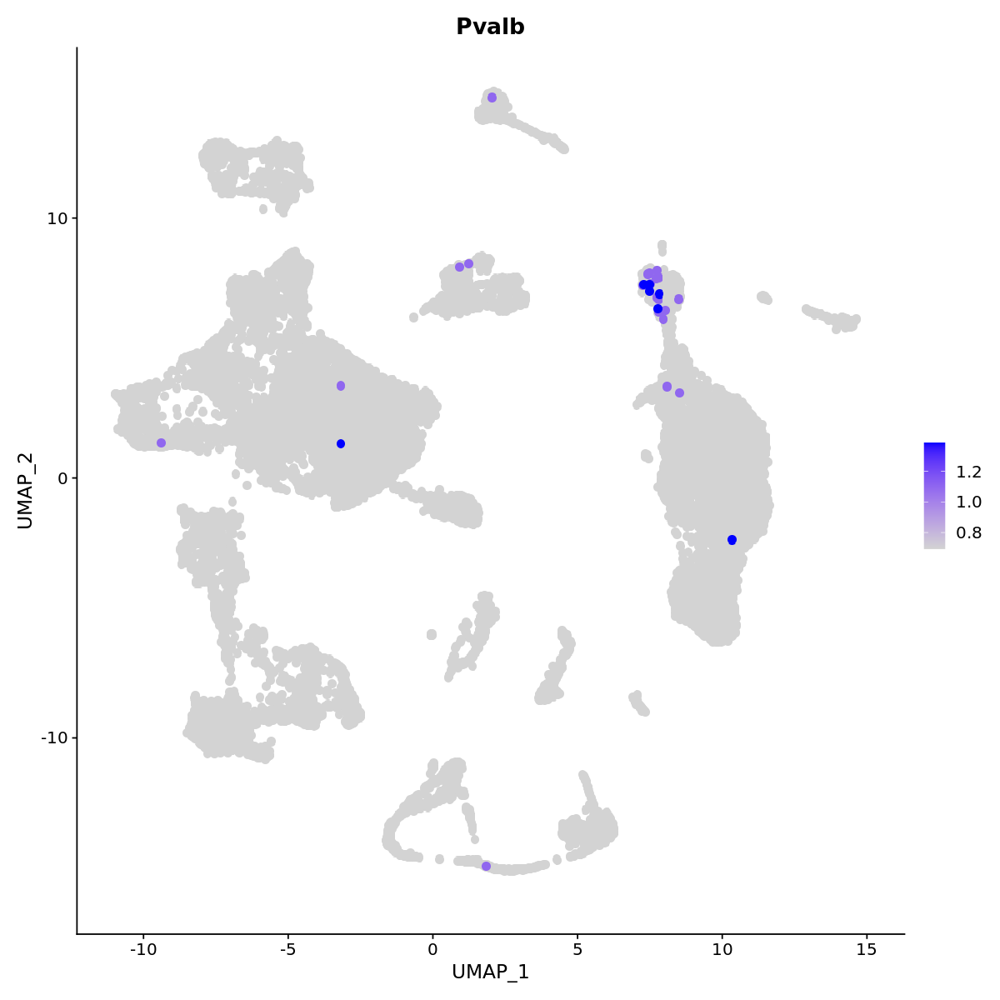

In [442]:
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(campbell,
            features = c("Pvalb"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

Warning message in FeaturePlot(campbell, features = c("Lmx1a"), pt.size = 5, order = TRUE, :
"All cells have the same value (0.693147180559945) of Lmx1a."


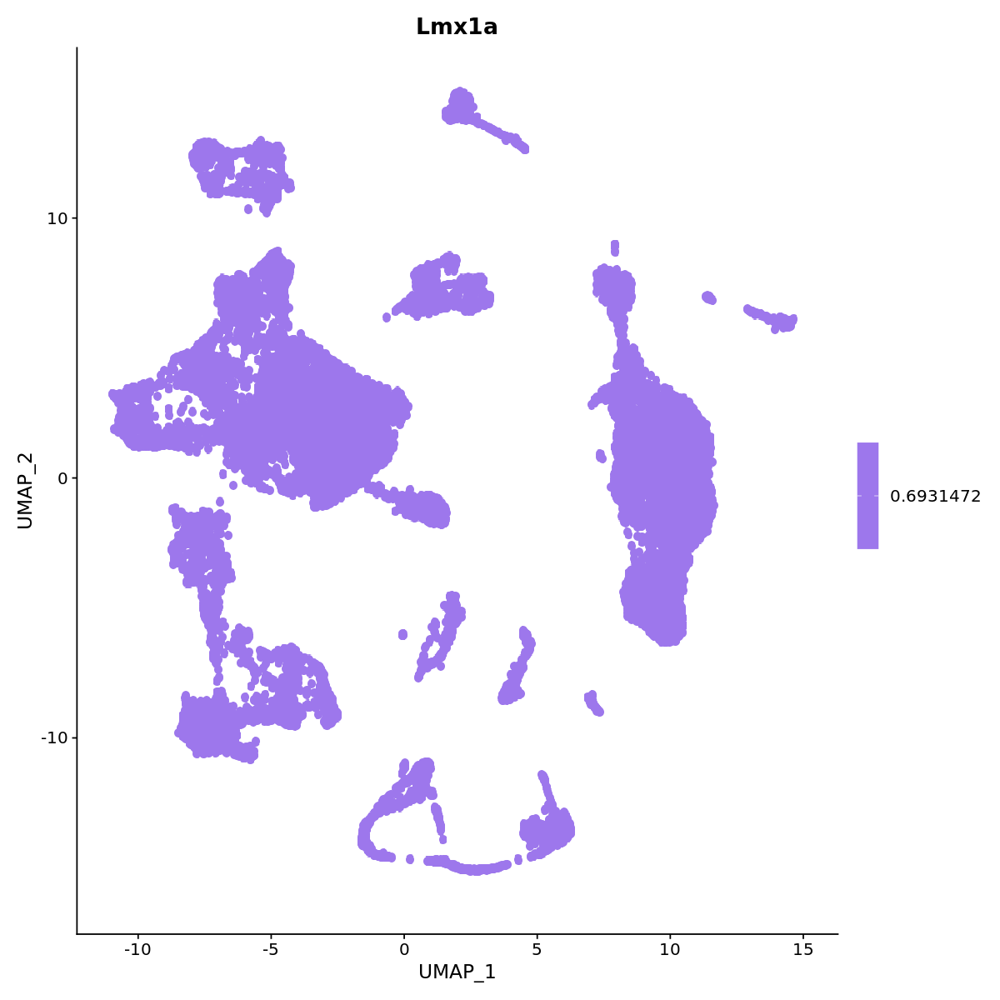

In [13]:
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(campbell,
            features = c("Lmx1a"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

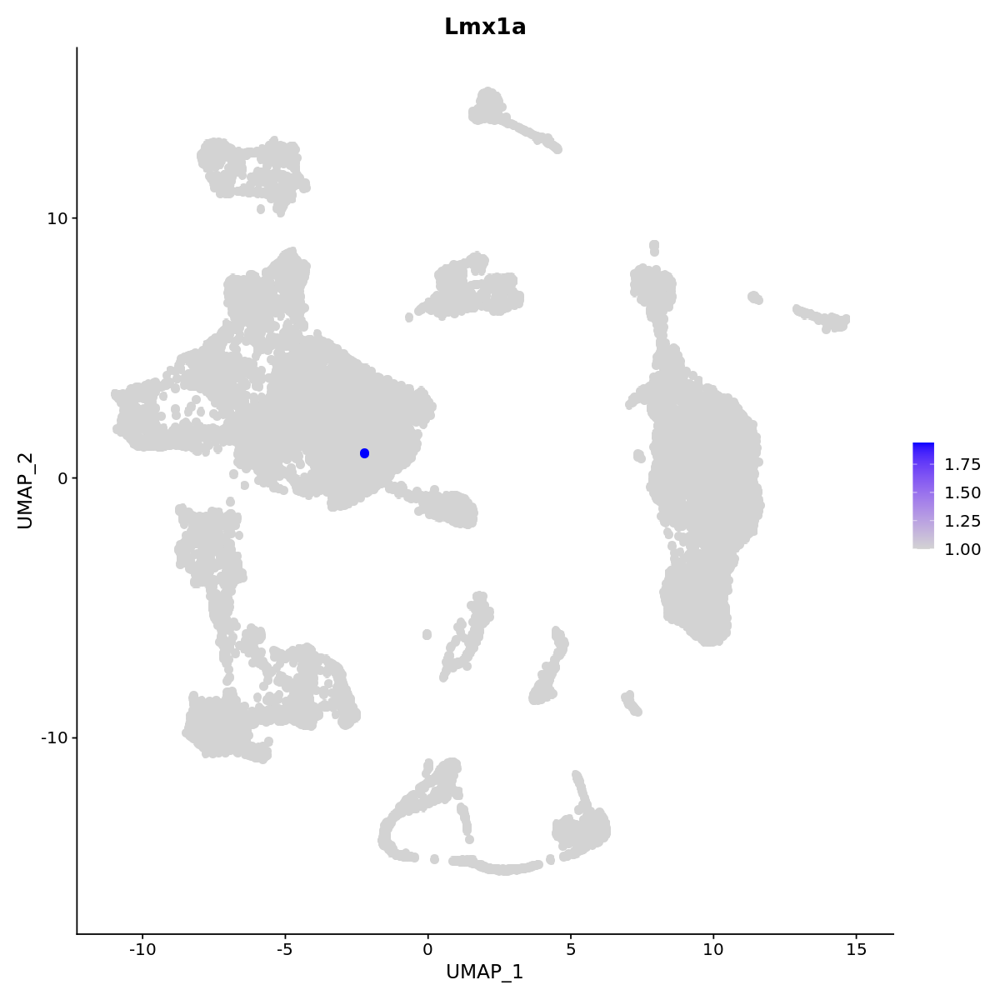

In [15]:
DefaultAssay(campbell) = "originalexp"
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(campbell,
            features = c("Lmx1a"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

In [16]:
cp_neurons = readRDS('/projects/dylan/cp_targets/data/wt_neuron_seurat.rds')
cp_neurons

An object of class Seurat 
61077 features across 78748 samples within 3 assays 
Active assay: limma (20359 features, 3000 variable features)
 2 other assays present: RNA, SCT
 3 dimensional reductions calculated: pclimma, pcsct, umap

In [27]:
dput(colnames(cp_neurons@meta.data))

c("orig.ident", "nCount_RNA", "nFeature_RNA", "hto_global", "hash_max", 
"hash_id", "doublet", "sizeFactor", "proportion_dub_neighbors", 
"predicted_dub_std", "predicted_dub_cut", "sum", "detected", 
"altexps_hto_sum", "altexps_hto_detected", "altexps_hto_percent", 
"altexps_spliced_sum", "altexps_spliced_detected", "altexps_spliced_percent", 
"altexps_unspliced_sum", "altexps_unspliced_detected", "altexps_unspliced_percent", 
"total", "discard", "hash", "age", "weight", "length", "cage", 
"diet", "geno", "treatment", "time", "litter_size", "collection_date", 
"x10x_version", "seq_pool", "hash_pool", "kitv", "nCount_SCT", 
"nFeature_SCT", "nCount_limma", "nFeature_limma", "limma_snn_res.0.8", 
"seurat_clusters", "predicted.id", "prediction.score.max", "sex_call", 
"group")


In [32]:
dput(unique(cp_neurons@meta.data$age))

c(4, 6, 14, 54, 10, 12, 8, 0, 20, 28, 32, 24, 16, 56)


In [34]:
cpa = subset(cp_neurons, subset = age %in% c(54, 56))
cpa

An object of class Seurat 
61077 features across 13962 samples within 3 assays 
Active assay: SCT (20359 features, 3000 variable features)
 2 other assays present: RNA, limma
 3 dimensional reductions calculated: pclimma, pcsct, umap

In [36]:
cpa = Seurat::SCTransform(cpa,
                        assay='RNA',
                        method="glmGamPoi",
                        vars.to.regress="seq_pool",
                        verbose=TRUE)
cpa = cpa %>% run_sct_chaser
cpa

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 20313 by 13962

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 43 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 20313 genes



  |======================================================================| 100%


Computing corrected count matrix for 20313 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 5.820366 mins

Determine variable features

Place corrected count matrix in counts slot

Regressing out seq_pool

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.RNA; see ?make.names for more details on syntax validity"
Warning message:
"Cannot add objects with duplicate keys (offending key: PC_), setting key to 'pca_'"
16:30:09 UMAP embedding parameters a = 0.9922 b = 1.112

16:30:10 Read 13962 rows and found 30 numeric columns

16:30:10 Using Annoy for neighbor search, n_neighbors = 30

16:30:10 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

16:30:11 Writing NN index file to temp f

An object of class Seurat 
61031 features across 13962 samples within 3 assays 
Active assay: SCT (20313 features, 3000 variable features)
 2 other assays present: RNA, limma
 4 dimensional reductions calculated: pclimma, pcsct, umap, pca

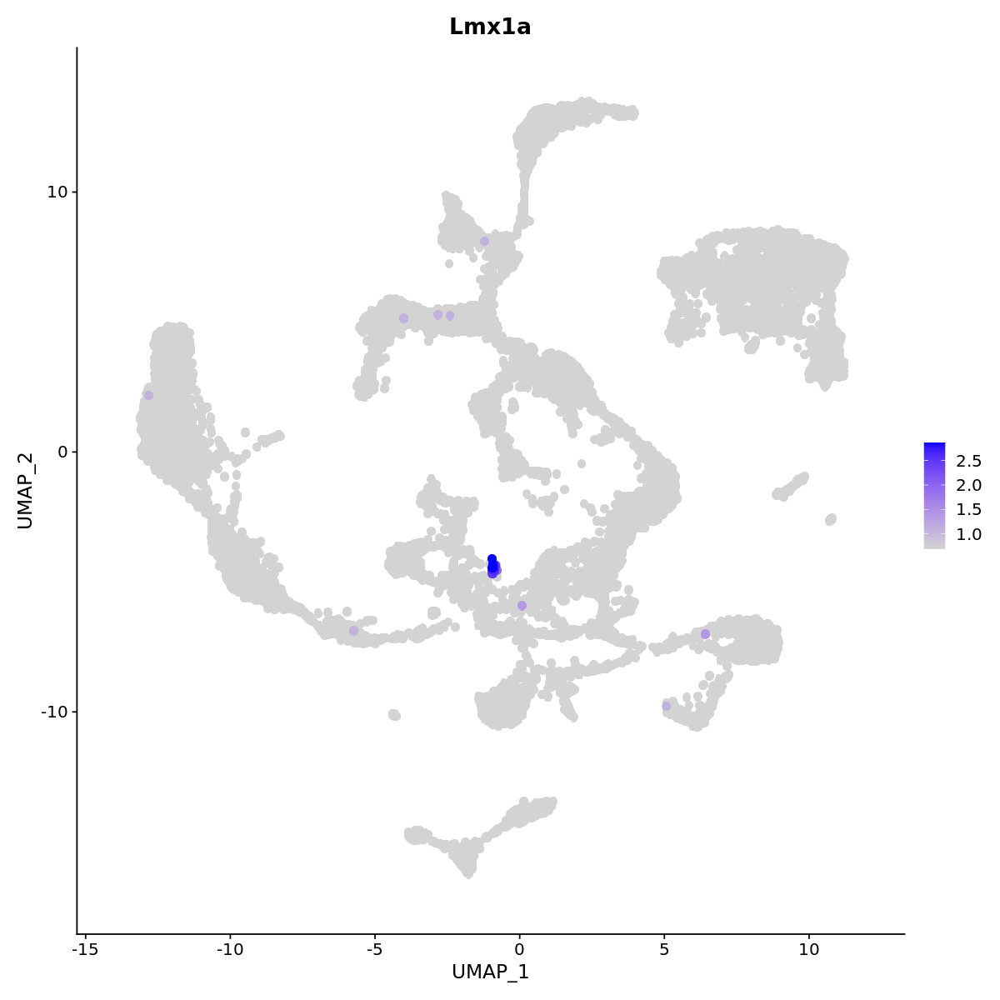

In [37]:
DefaultAssay(cpa) = "SCT"
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(cpa,
            features = c("Lmx1a"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

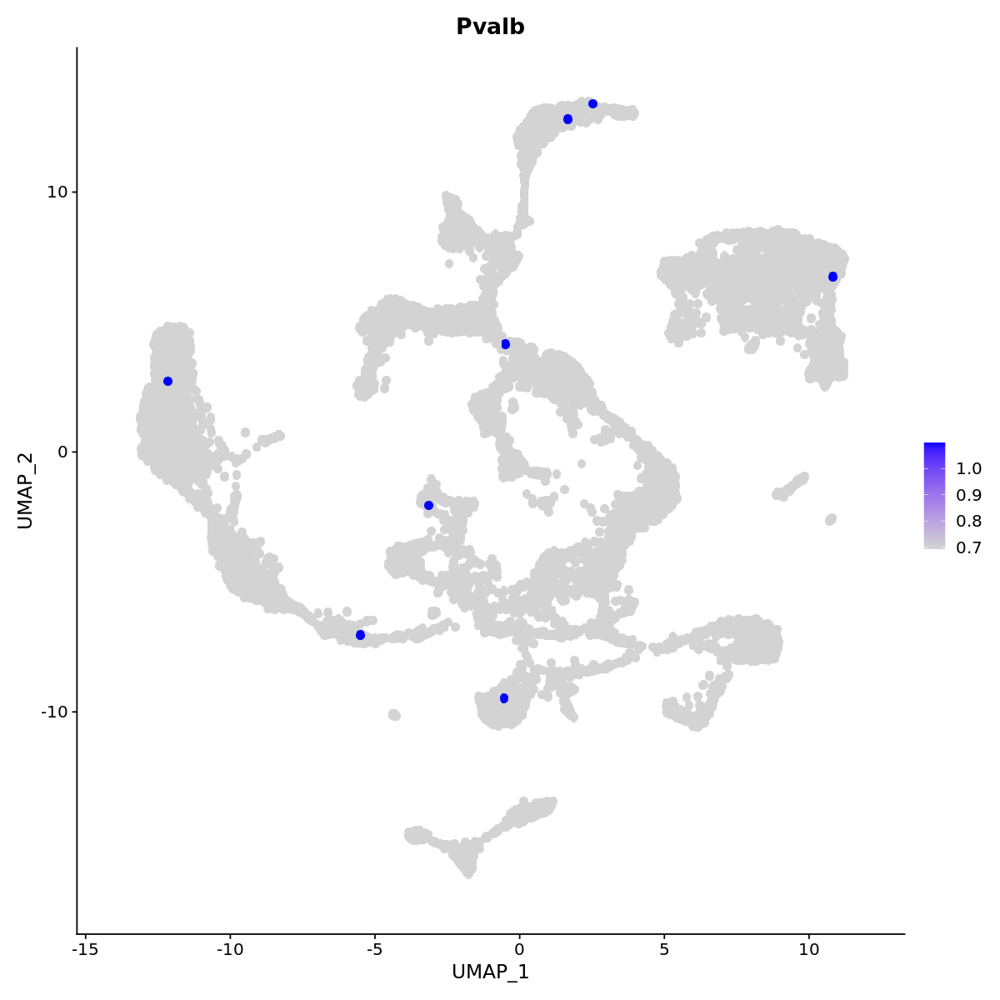

In [443]:
DefaultAssay(cpa) = "SCT"
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(cpa,
            features = c("Pvalb"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

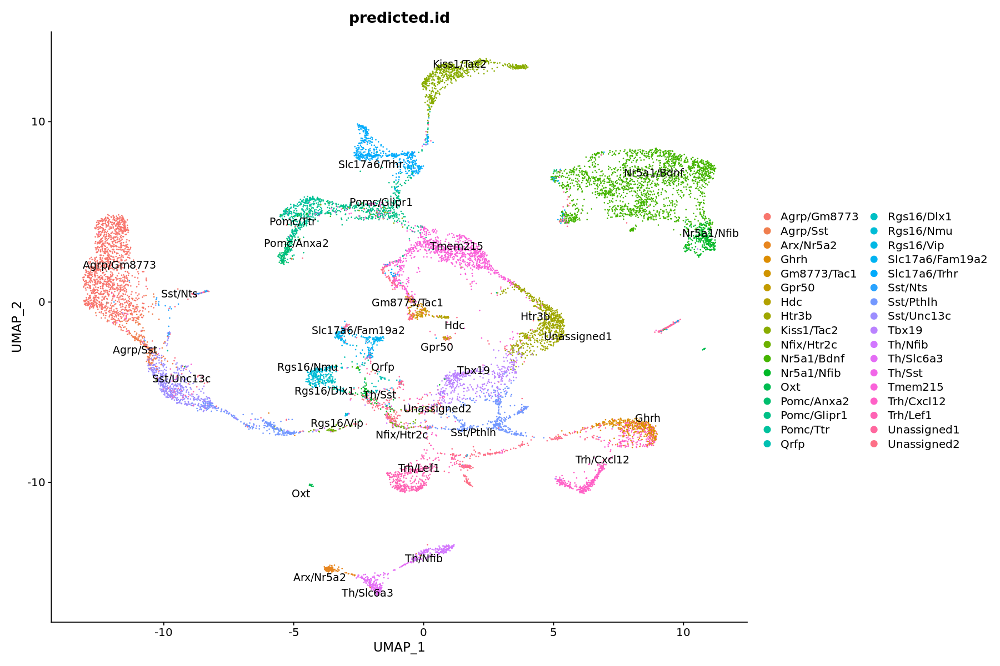

In [38]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(cpa, reduction = "umap", group.by = "predicted.id", label = TRUE,  repel = TRUE)

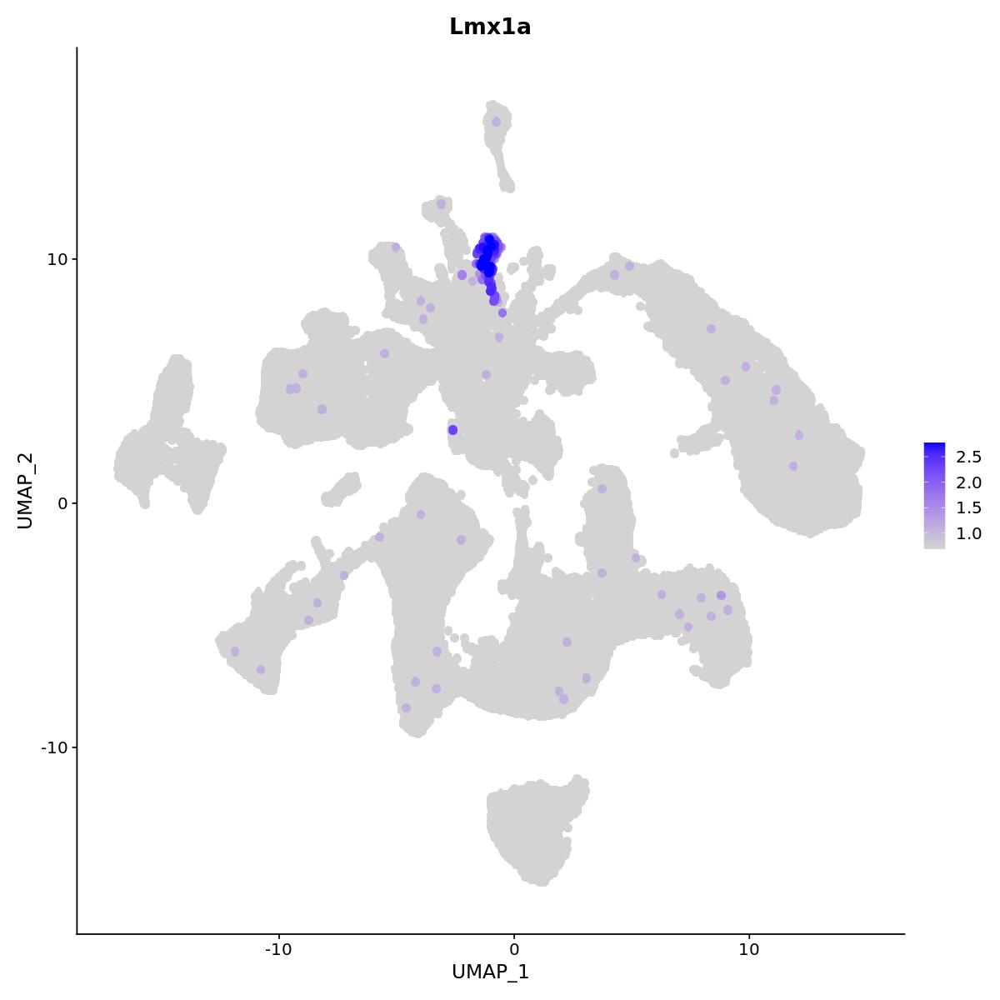

In [21]:
DefaultAssay(cp_neurons) = "SCT"
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(cp_neurons,
            features = c("Lmx1a"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: Foxa1"


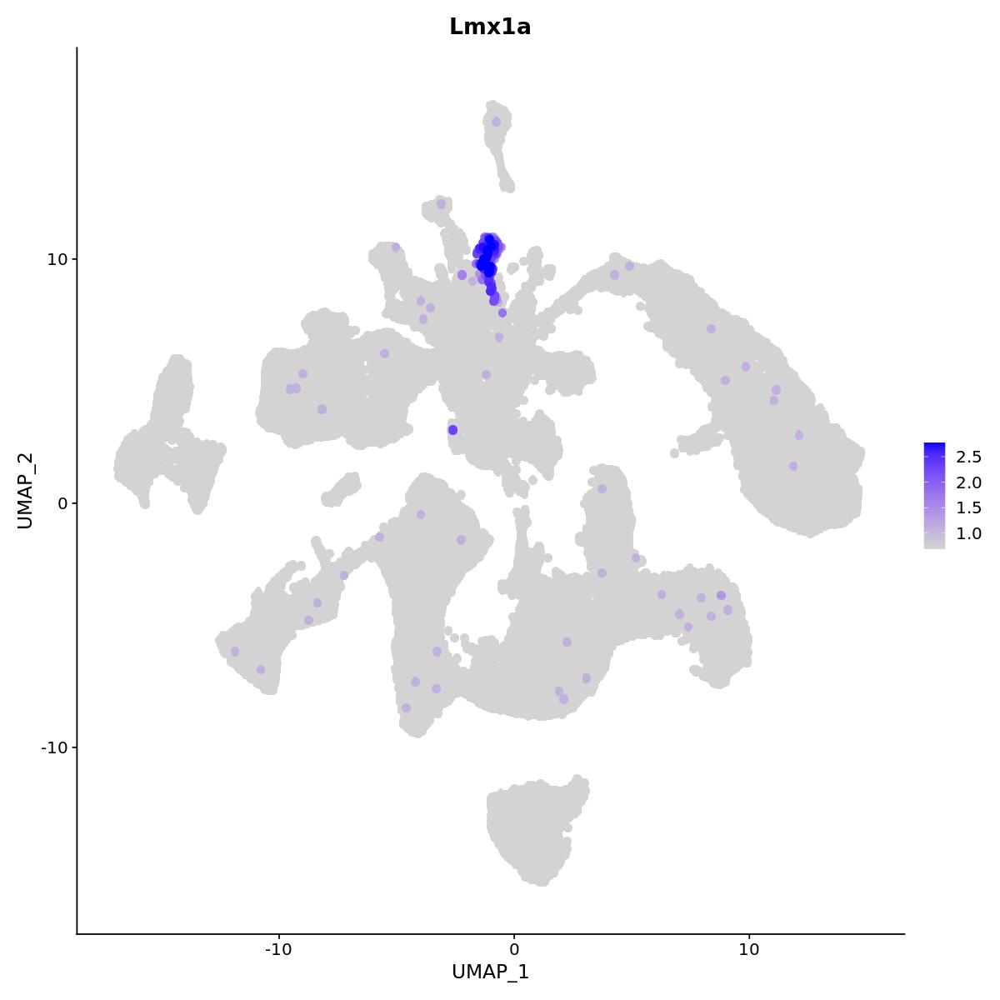

In [30]:
DefaultAssay(cp_neurons) = "SCT"
options(repr.plot.width=10, repr.plot.height=10)
fp = FeaturePlot(cp_neurons,
            features = c("Lmx1a", "Foxa1"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

Warning message in FetchData.Seurat(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: Foxa1"


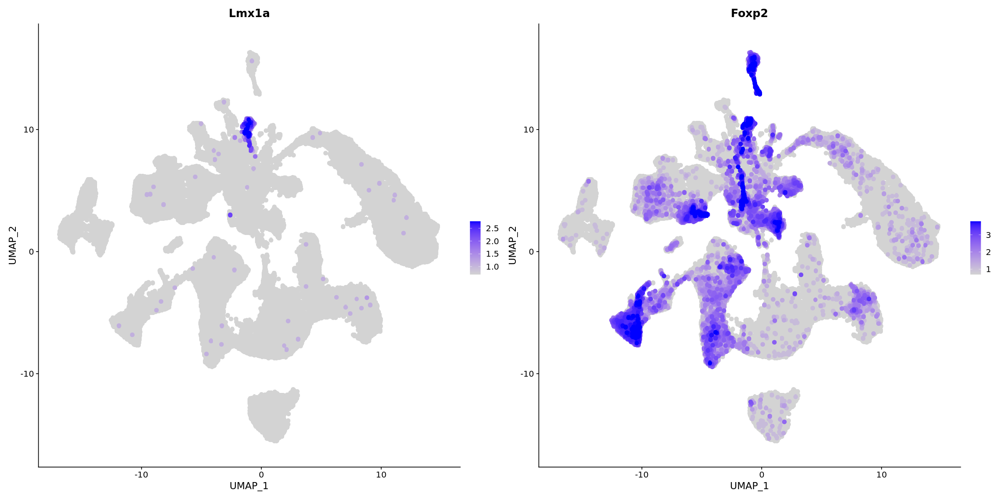

In [41]:
DefaultAssay(cp_neurons) = "SCT"
options(repr.plot.width=20, repr.plot.height=10)
fp = FeaturePlot(cp_neurons,
            features = c("Lmx1a", "Foxa1", "Foxp2"),
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp

Warning message:
"ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


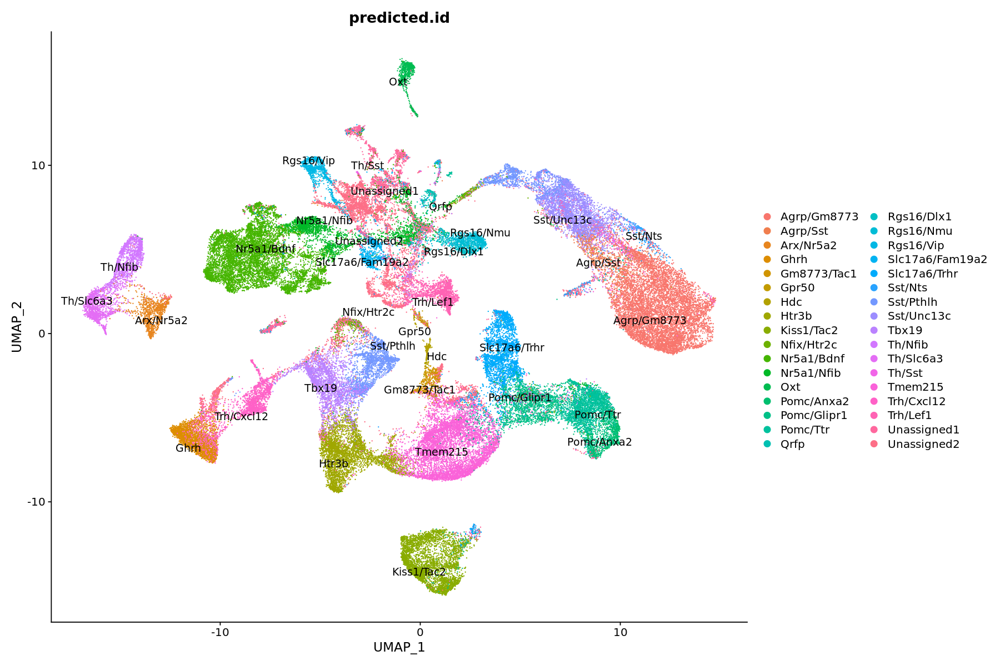

In [24]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(cp_neurons, reduction = "umap", group.by = "predicted.id", label = TRUE,  repel = TRUE)

In [411]:
load("/home/cbmr/qwn903/nid-projects/my_projects/lepR_r_adan/dat/kim10x_seurat_obj.RData")


In [412]:
ls()

[1] "a"                                   "add_meta_to_exp"                    
 [3] "campbell"                            "counts"                             
 [5] "cp_neurons"                          "cpa"                                
 [7] "downsample_seurat_obj"               "exit"                               
 [9] "find_anchors_campbell"               "find_integration_anchors"           
[11] "fp"                                  "installBiocManagerAnnotationPackage"
[13] "integrate_data"                      "kim"                                
[15] "load_campbell"                       "make_exp_list"                      
[17] "new_ids"                             "obj"                                
[19] "obj_splits"                          "obj_un1"                            
[21] "open_obj"                            "plot"                               
[23] "plots_list"                          "predictions"                        
[25] "predictions_f"                       "prep_sc_transform"                  
[27] "PROJECT_DIR"                         "read_metadata"                      
[29] "read_sc"                             "run_find_clusters"                  
[31] "run_find_neighbors"                  "run_pca"                            
[33] "run_sct_chaser"                      "run_umap"                           
[35] "save_obj"                            "sc_transform_campbell"              
[37] "sc_transform_fgf1"                   "select_integration_featuers"        
[39] "set_anaconda_paths"                  "set_lib_paths"                      
[41] "splitwrapper"                        "subset_exp"                         
[43] "subset_exp_by_strain"                "transfer_anchors"                   
[45] "transfer_campbell_labels"

In [413]:
kim

An object of class Seurat 
46922 features across 41385 samples within 2 assays 
Active assay: SCT (20045 features, 3000 variable features)
 1 other assay present: RNA

In [414]:
kim@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,tv_cluster_id,cell_type,tv_cluster_color,subregion_label,subregion_id,subregion_color,umis_label,genes_label,umis_id,umis_color,genes_id,genes_color,cca_cluster_id,cca_cluster_label,cca_cluster_color,nCount_SCT,nFeature_SCT
,<fct>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<int>
4_AGAATAGAGACATAAC,4,4592,2477,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,4676,2526,3696,#FAFAFC,1883,#FFD9D9,25,Nr5a1_5,#4739A6,5498,2478
4_CGTCAGGTCAACCAAC,4,5696,2892,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,5801,2947,4782,#FFE5E5,2304,#FFB9B9,25,Nr5a1_5,#4739A6,5836,2891
4_GTCTCGTGTCGTTGTA,4,3885,2270,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,3957,2306,2983,#E2E2F2,1663,#FFECEC,25,Nr5a1_5,#4739A6,5382,2298
4_TGCGGGTCAAGAGTCG,4,6158,3021,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,6277,3086,5224,#FFDADA,2443,#FFB0B0,25,Nr5a1_5,#4739A6,6161,3021
5_AAAGATGCACATTAGC,5,6234,3057,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,6362,3123,5305,#FFD8D8,2480,#FFADAD,25,Nr5a1_5,#4739A6,6234,3057
5_ATAAGAGAGTTAGGTA,5,6537,3256,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,6680,3325,5604,#FFD1D1,2682,#FFA1A1,10,Satb2_1,#294FE6,6495,3256
6_CTGCGGAGTTGATTGC,6,6785,3319,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,6901,3382,5808,#FFCDCD,2739,#FF9D9D,25,Nr5a1_5,#4739A6,6657,3319
6_GTAACGTAGCTGAACG,6,10913,4369,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,11146,4464,9734,#FF8A8A,3821,#FF6464,10,Satb2_1,#294FE6,7175,4116
6_GTCCTCACACAGGCCT,6,7317,3441,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,7465,3513,6326,#FFC2C2,2870,#FF9595,10,Satb2_1,#294FE6,6873,3441


In [415]:
new_ids = gprofiler2::gconvert(rownames(kim@assays$RNA@meta.features),
                         organism = "mmusculus",
                         target = "ENTREZGENE", filter_na = FALSE)
new_ids = new_ids %>%
mutate(target = paste0(target)) %>%
mutate(target = case_when(target %in% 'NA' ~ input,
                        target != 'NA' ~ paste0(target))
      ) %>%
distinct(input, .keep_all = TRUE)
head(new_ids)

,input_number,input,target_number,target,name,description,namespace
,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,1,ENSMUSG00000051951,1.1,Xkr4,Xkr4,X-linked Kx blood group related 4 [Source:MGI Symbol;Acc:MGI:3528744],"ARRAYEXPRESS,ENSG"
2,2,ENSMUSG00000089699,2.1,ENSMUSG00000089699,NA,NA,
3,3,ENSMUSG00000102343,3.1,ENSMUSG00000102343,NA,NA,
4,4,ENSMUSG00000025900,4.1,Rp1,Rp1,retinitis pigmentosa 1 (human) [Source:MGI Symbol;Acc:MGI:1341105],"ARRAYEXPRESS,ENSG"
5,5,ENSMUSG00000025902,5.1,Sox17,Sox17,SRY (sex determining region Y)-box 17 [Source:MGI Symbol;Acc:MGI:107543],"ARRAYEXPRESS,ENSG"
6,6,ENSMUSG00000104328,6.1,ENSMUSG00000104328,NA,NA,


In [416]:
counts = kim@assays$RNA@counts
rownames(counts) = new_ids$target
kim = CreateSeuratObject(counts = counts,
                         assay = "RNA",
                         meta.data = kim@meta.data)
kim

Warning message:
"Non-unique features (rownames) present in the input matrix, making unique"


An object of class Seurat 
26877 features across 41385 samples within 1 assay 
Active assay: RNA (26877 features, 0 variable features)

In [417]:
head(kim@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,tv_cluster_id,cell_type,tv_cluster_color,subregion_label,subregion_id,subregion_color,umis_label,genes_label,umis_id,umis_color,genes_id,genes_color,cca_cluster_id,cca_cluster_label,cca_cluster_color,nCount_SCT,nFeature_SCT
,<fct>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<int>,<chr>,<int>,<chr>,<int>,<chr>,<chr>,<dbl>,<int>
4_AGAATAGAGACATAAC,4,4592,2477,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,4676,2526,3696,#FAFAFC,1883,#FFD9D9,25,Nr5a1_5,#4739A6,5498,2478
4_CGTCAGGTCAACCAAC,4,5696,2892,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,5801,2947,4782,#FFE5E5,2304,#FFB9B9,25,Nr5a1_5,#4739A6,5836,2891
4_GTCTCGTGTCGTTGTA,4,3885,2270,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,3957,2306,2983,#E2E2F2,1663,#FFECEC,25,Nr5a1_5,#4739A6,5382,2298
4_TGCGGGTCAAGAGTCG,4,6158,3021,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,6277,3086,5224,#FFDADA,2443,#FFB0B0,25,Nr5a1_5,#4739A6,6161,3021
5_AAAGATGCACATTAGC,5,6234,3057,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,6362,3123,5305,#FFD8D8,2480,#FFADAD,25,Nr5a1_5,#4739A6,6234,3057
5_ATAAGAGAGTTAGGTA,5,6537,3256,24,Nr5a1_4_5,#9162FF,dm/c,1,#FF7373,6680,3325,5604,#FFD1D1,2682,#FFA1A1,10,Satb2_1,#294FE6,6495,3256


In [418]:
kim = Seurat::SCTransform(kim,
                        assay='RNA',
                        method="glmGamPoi",
                        verbose=TRUE)

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 20045 by 41385

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 125 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 20045 genes



  |======================================================================| 100%


Computing corrected count matrix for 20045 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 14.58577 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Warning message:
"Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.RNA; see ?make.names for more details on syntax validity"


In [419]:
kim = kim %>% SCTransform(vst.flavor = "v2") %>% run_sct_chaser()
kim

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 17132

Total overdispersed genes: 15804

Excluding 1328 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 20045 by 41385

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Setting estimate of  429 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 3022

Total # of Step1 poisson genes (theta=Inf; variance < mean): 448

Total # of poisson genes (theta=Inf; variance < mean): 4184

Calling offset model for all 4184 poisson genes

Found 636 outliers - those will be ignored in fitting/regularization step


Ignoring theta inf genes

Replacing fit params for 4184 poisson genes by theta=Inf

Setting min_variance based on median UMI:  0.04

Second step: Get residuals using fitted parameters for 20045 genes



  |======================================================================| 100%


Computing corrected count matrix for 20045 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 13.306 mins

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

15:39:19 UMAP embedding parameters a = 0.9922 b = 1.112

15:39:19 Read 41385 rows and found 30 numeric columns

15:39:19 Using Annoy for neighbor search, n_neighbors = 30

15:39:19 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:39:23 Writing NN index file to temp file /scratch/nmq407/R_tmp//Rtmp7d1Mub/file1cc0d5cd31cb4

15:39:23 Searching Annoy index using 1 thread, search_k = 3000

15:39:41 Annoy recall = 100%

15:39:45 Commencing smooth kNN distance calibration using 1 thread

15:39:49 Initializing from normalized Laplacian + noise

15:39:50 Commencing optimizatio

An object of class Seurat 
46922 features across 41385 samples within 2 assays 
Active assay: SCT (20045 features, 3000 variable features)
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [420]:
transfer_anchors <- Seurat::FindTransferAnchors(reference = kim,reference.reduction = "pca",
                                        query = obj,
                                        dims = 1:30,
                                        normalization.method="SCT",
                                        recompute.residuals=FALSE)

Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 16300 anchors



In [421]:
colnames(kim@meta.data)

[1] "orig.ident"        "nCount_RNA"        "nFeature_RNA"     
 [4] "tv_cluster_id"     "cell_type"         "tv_cluster_color" 
 [7] "subregion_label"   "subregion_id"      "subregion_color"  
[10] "umis_label"        "genes_label"       "umis_id"          
[13] "umis_color"        "genes_id"          "genes_color"      
[16] "cca_cluster_id"    "cca_cluster_label" "cca_cluster_color"
[19] "nCount_SCT"        "nFeature_SCT"      "SCT_snn_res.0.8"  
[22] "seurat_clusters"

In [422]:
kim@meta.data$label = interaction(kim@meta.data$subregion_label, kim@meta.data$cca_cluster_label, sep = '__')
# kim@meta.data$label = kim@meta.data$smart_seq_cluster_label

In [423]:
predictions <- Seurat::TransferData(anchorset = transfer_anchors,
                        refdata = dplyr::pull(kim@meta.data, "label"),
                        dims = 1:30,
                        k.weight = 30)

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [424]:
colnames(predictions)[colnames(predictions) == 'predicted.id'] <- "kim_labels"

In [425]:
head(predictions)

,kim_labels,prediction.score.dm.c__Nr5a1_5,prediction.score.dm.c__Satb2_1,prediction.score.dm.c__Nr5a1_4,prediction.score.dm.c__Nr5a1_2,prediction.score.dm.c__Nr5a1_6,prediction.score.dm.c__Dlk1_6,prediction.score.dm.c__Nr5a1_1,prediction.score.dm.c__Nr5a1_7,prediction.score.dm.c__Nr5a1_3,⋯,prediction.score.vl__Outliers,prediction.score.dm.c__Nr5a1_Foxp2_1,prediction.score.dm.c__Dlk1_2,prediction.score.vl__Nr5a1_5,prediction.score.vl__Nr5a1_4,prediction.score.vl__Nr5a1_8,prediction.score.vl__Nr5a1_10,prediction.score.dm.c__Nr5a1_9,prediction.score.dm.c__Esr1_1,prediction.score.max
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GCAGCCACACAGCCAC_1_1,dm/c__Nr5a1_2,0.01429939,0,0.2789027,0.42819480,0,0,0.00000000,0.0000000,0,⋯,0,0.00000000,0,0,0,0,0,0.0000000,0,0.4281948
TGCTTGCAGTTCCGTA_1_1,vl__Esr1_6,0.00000000,0,0.0000000,0.03486580,0,0,0.00000000,0.0000000,0,⋯,0,0.00000000,0,0,0,0,0,0.0000000,0,0.3552910
GAGGCAAGTACCTAAC_1_1,vl__Nup62cl,0.00000000,0,0.0000000,0.00000000,0,0,0.00000000,0.0000000,0,⋯,0,0.02987721,0,0,0,0,0,0.0000000,0,0.8149539
GTAATGCTCTGTCCCA_1_1,dm/c__Nr5a1_9,0.00000000,0,0.0000000,0.00000000,0,0,0.00000000,0.0000000,0,⋯,0,0.00000000,0,0,0,0,0,0.4640902,0,0.4640902
GATCACACACCCAAGC_1_1,vl__Dlk1_6,0.00000000,0,0.0000000,0.15035473,0,0,0.02149718,0.0000000,0,⋯,0,0.00000000,0,0,0,0,0,0.0000000,0,0.2479725
GGACGTCCAGGCCCTA_1_1,dm/c__Nr5a1_4,0.34404101,0,0.4616181,0.07202461,0,0,0.00000000,0.1223163,0,⋯,0,0.00000000,0,0,0,0,0,0.0000000,0,0.4616181


In [426]:
predictions_f <- predictions[c("kim_labels")]
obj = Seurat::AddMetaData(obj, metadata = predictions_f)

In [427]:
obj@meta.data

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,collection_date,isolation_date,batch,predicted.id,prediction.score.max,labels,nCount_integrated,nFeature_integrated,label,kim_labels
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<fct>,<dbl>,<int>,<chr>,<chr>
GCAGCCACACAGCCAC_1_1,SI-TT-A11,69641,7356,SI-TT-A11,1532,12,D706,9837,3757,59804,⋯,220329,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,0,0,dm/c__Nr5a1_3,dm/c__Nr5a1_2
TGCTTGCAGTTCCGTA_1_1,SI-TT-A11,71825,7455,SI-TT-A11,1616,12,D706,8834,3443,62991,⋯,220201,22/6/2022,Batch 1,Unassigned1,0.8065577,Unassigned1,0,0,vl__Satb2_1,vl__Esr1_6
GAGGCAAGTACCTAAC_1_1,SI-TT-A11,68817,7344,SI-TT-A11,1884,12,D706,8246,3326,60571,⋯,220201,22/6/2022,Batch 1,Unassigned1,0.8525726,Unassigned1,0,0,vl__Esr1_4,vl__Nup62cl
GTAATGCTCTGTCCCA_1_1,SI-TT-A11,69910,7425,SI-TT-A11,2555,12,D706,10497,3727,59413,⋯,211213,22/6/2022,Batch 1,Hdc,1.0000000,Gm8773_Tac1-Hdc,0,0,vl__Esr1_6,dm/c__Nr5a1_9
GATCACACACCCAAGC_1_1,SI-TT-A11,62110,6862,SI-TT-A11,1728,12,D706,9451,3566,52659,⋯,220329,22/6/2022,Batch 1,Unassigned1,0.6368759,Unassigned1,0,0,dm/c__Nr5a1_8,vl__Dlk1_6
GGACGTCCAGGCCCTA_1_1,SI-TT-A11,63372,7265,SI-TT-A11,1778,12,D706,8563,3478,54809,⋯,211214,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,0,0,dm/c__Nr5a1_5,dm/c__Nr5a1_4
CAGATACAGGTCATTC_1_1,SI-TT-A11,63596,7244,SI-TT-A11,1523,12,D706,8690,3530,54906,⋯,220407,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,0,0,dm/c__Nr5a1_7,dm/c__Nr5a1_5
CGTTCTGGTTGTCCCT_1_1,SI-TT-A11,64906,7215,SI-TT-A11,1713,12,D706,8040,3412,56866,⋯,211214,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,0,0,dm/c__Nr5a1_4,dm/c__Nr5a1_4
CTTCTCTAGCCTAACT_1_1,SI-TT-A11,65424,7288,SI-TT-A11,2006,12,D706,9914,3540,55510,⋯,220407,22/6/2022,Batch 1,Unassigned1,0.7387097,Unassigned1,0,0,vl__Dlk1_2,dm/c__Nr5a1_Foxp2_1


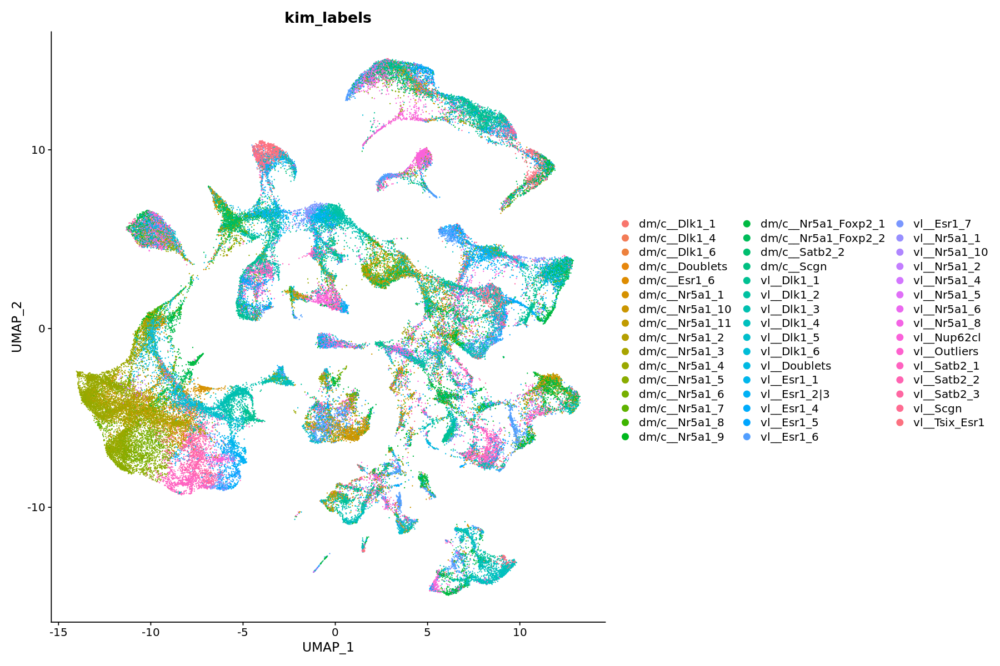

In [428]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "kim_labels",  repel = TRUE)

In [429]:
source("splitwrapper.R")

In [430]:
obj_splits = splitwrapper(obj, split.by="labels")

In [431]:
plots_list = obj_splits %>%
    map(~DimPlot(.x, reduction = "umap", group.by = "labels", label = TRUE,  repel = TRUE) + xlim(-15, 15) + ylim(-15, 15))

In [432]:
library(patchwork)

Warning message:
"Removed 1758 rows containing missing values (geom_point)."
Warning message:
"Removed 18 rows containing missing values (geom_text_repel)."


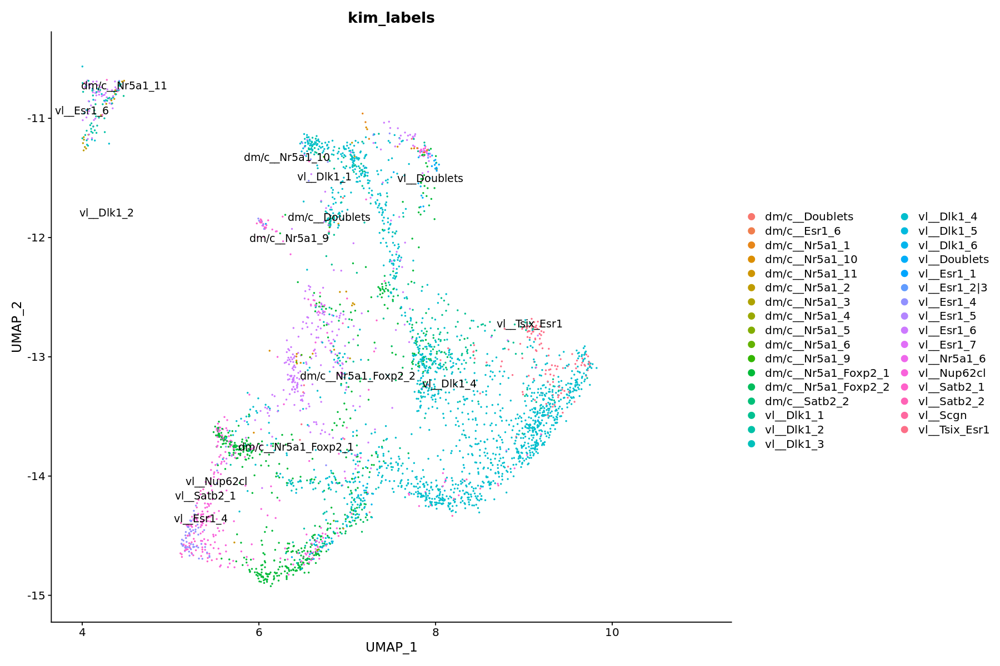

In [433]:
# DimPlot(obj_splits[[2]], reduction = "umap", group.by = "label", label = TRUE,  repel = TRUE) + xlim(-15, 15) + ylim(-15, 15)
DimPlot(obj_splits[[2]], reduction = "umap", group.by = "kim_labels", label = TRUE,  repel = TRUE) + xlim(4, 11) + ylim(-15, -10.5)

In [434]:
kim@assays$SCT@counts %>% head

   [[ suppressing 34 column names '4_AGAATAGAGACATAAC', '4_CGTCAGGTCAACCAAC', '4_GTCTCGTGTCGTTGTA' ... ]]



6 x 41385 sparse Matrix of class "dgCMatrix"
                                                                               
Xkr4               3 2 5 5 8 3 4 2 5 2 3 2 6 5 2 3 4 4 2 2 4 2 6 6 2 6 4 5 5 12
ENSMUSG00000089699 . . . . . . . . . . . . 1 . . . . . . . . 1 . . . . . . .  .
ENSMUSG00000102343 . . . . . . . . . . . . . . . . . . . . . . . . . . . . .  .
Rp1                . . . . . . . . . . . . . . . . . . . . . . . . . . . . .  .
Sox17              . . . . . . . . . . . . . . . . . . . . . . . . . . . . .  .
Mrpl15             . 1 . . . 1 1 . . . . 1 1 . . 1 . . . . . . . . . . . . .  .
                                 
Xkr4               3 1 1 5 ......
ENSMUSG00000089699 . . . . ......
ENSMUSG00000102343 . . . . ......
Rp1                . . . . ......
Sox17              . . . . ......
Mrpl15             . . . . ......

 .....suppressing 41351 columns in show(); maybe adjust 'options(max.print= *, width = *)'
 ..............................

In [383]:
2

[1] 2

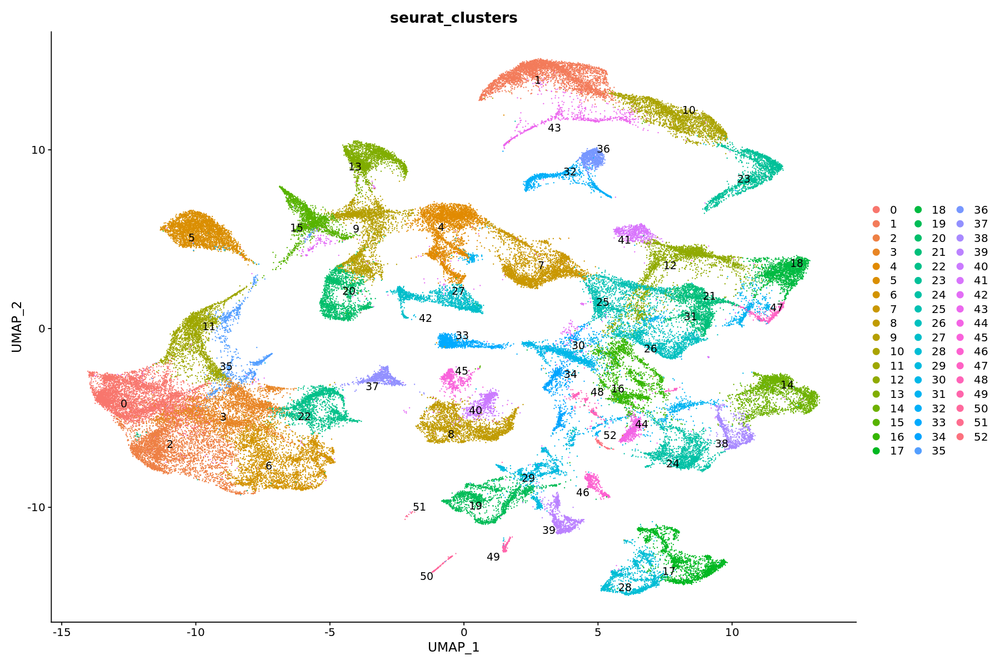

In [384]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "seurat_clusters", label = TRUE,  repel = TRUE)

In [385]:
length(unique(obj@meta.data$labels))

[1] 34

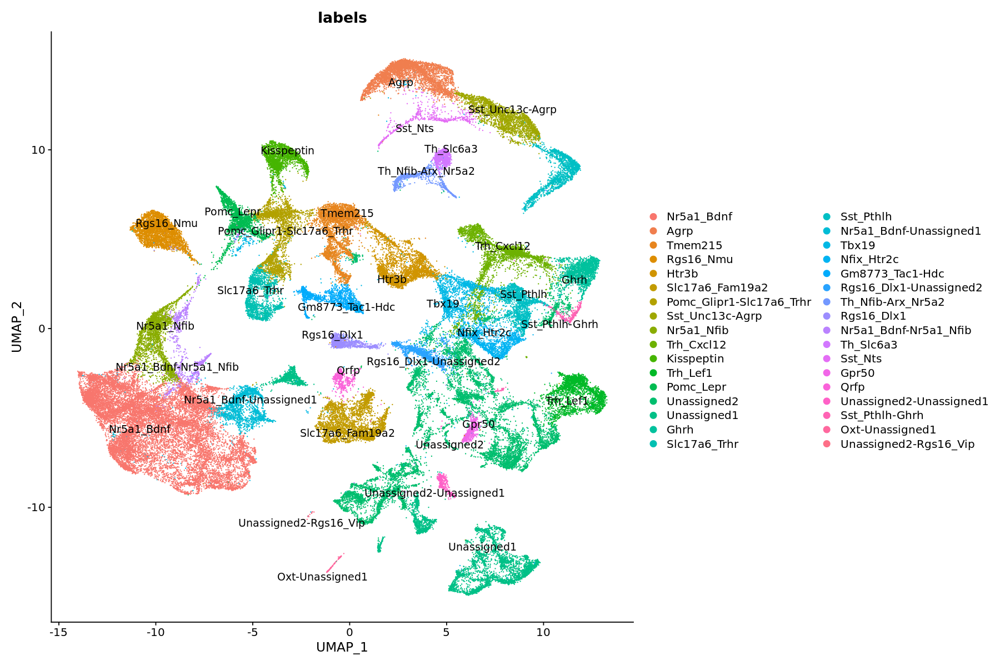

In [386]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "labels", label = TRUE,  repel = TRUE)

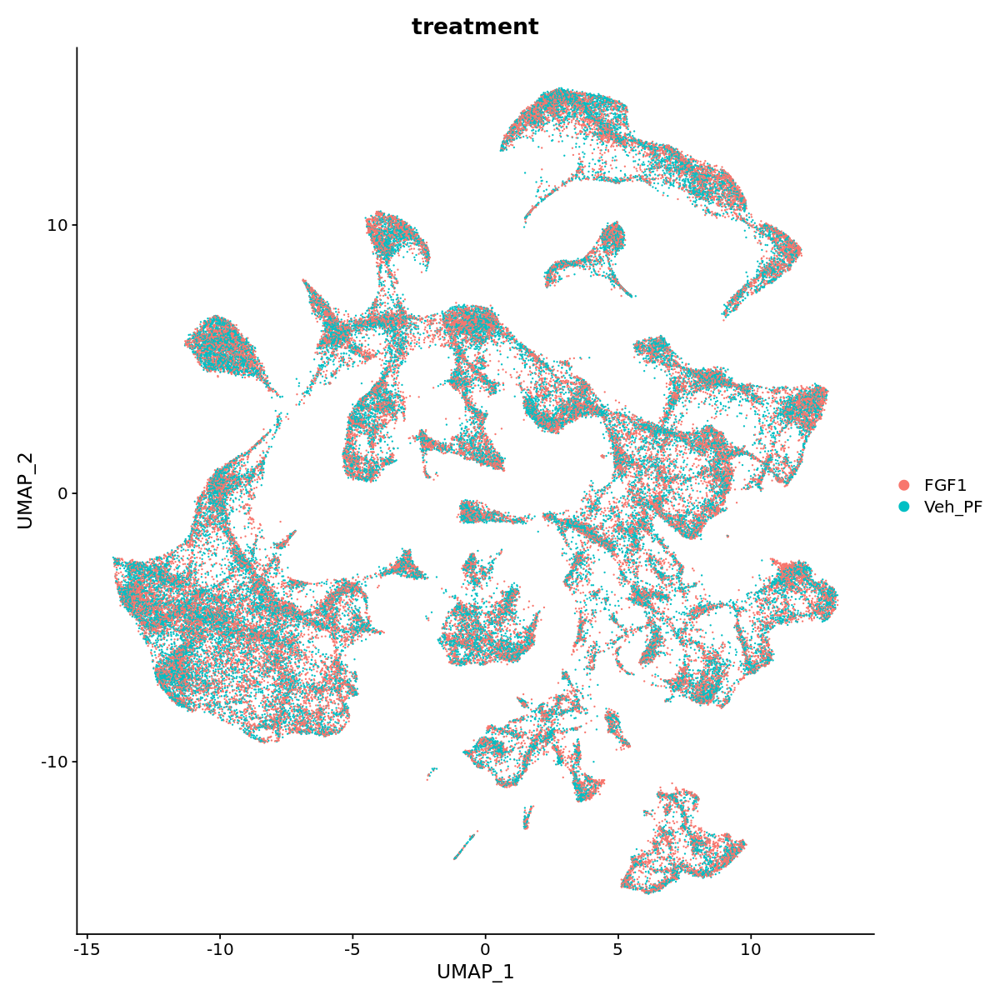

In [9]:
# obj@meta.data$GqPlus = obj@meta.data$Group == 'GqPlus'
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "treatment", label = FALSE)



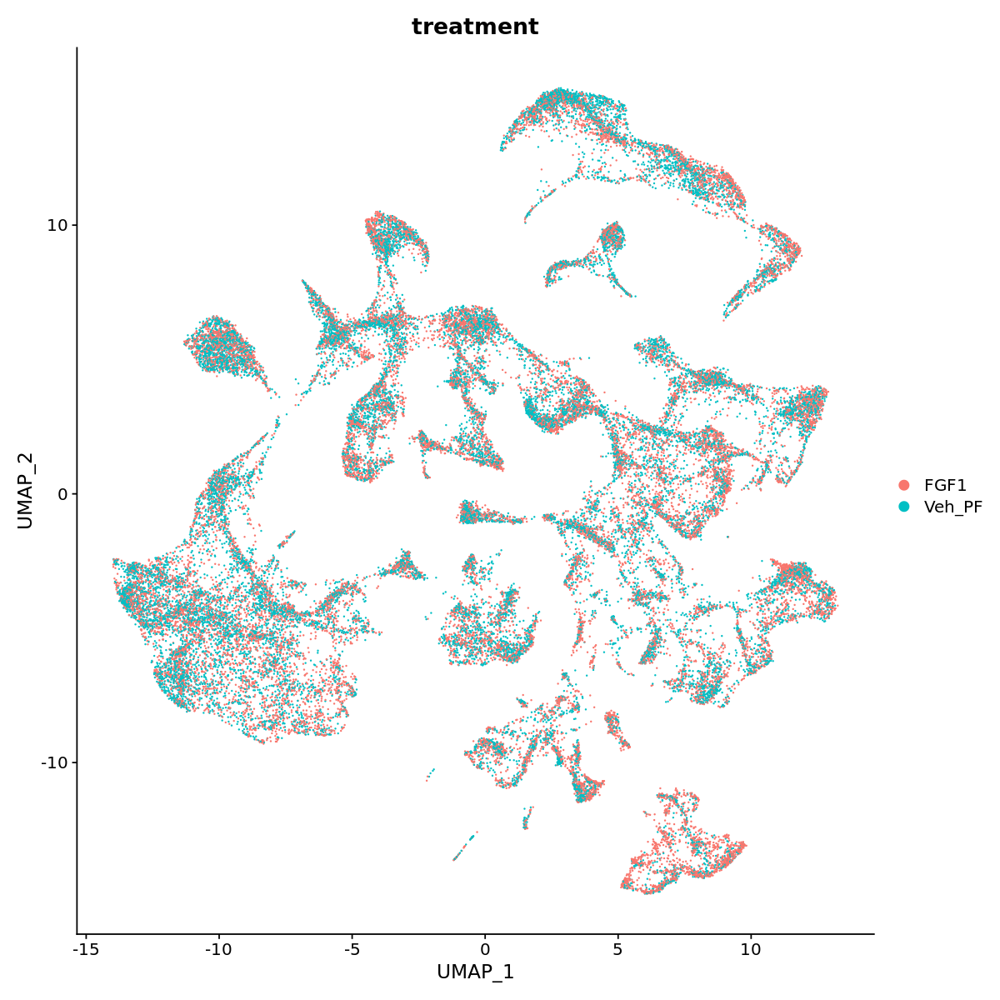

In [10]:
# obj@meta.data$GqPlus = obj@meta.data$Group == 'GqPlus'
obj_d5 = subset(obj, subset = time == "Day5")
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(obj_d5, reduction = "umap", group.by = "treatment", label = FALSE)

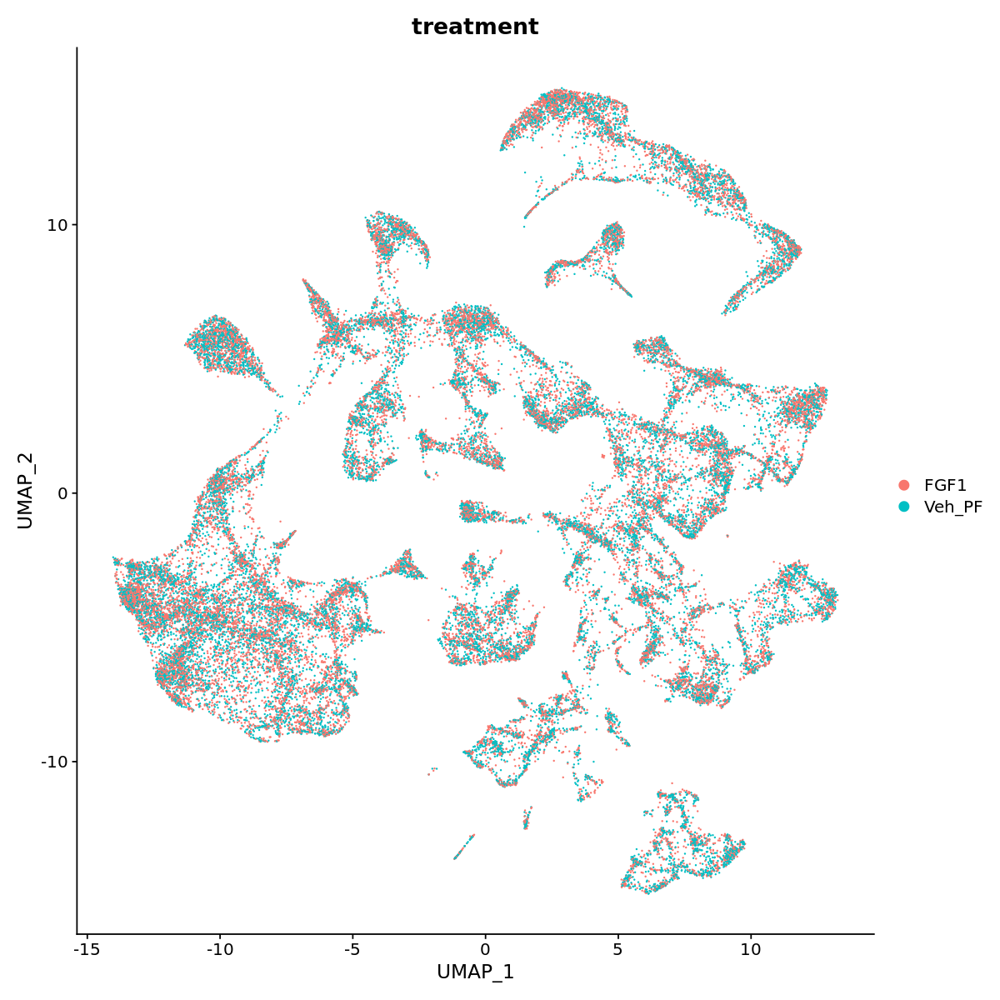

In [11]:
# obj@meta.data$GqPlus = obj@meta.data$Group == 'GqPlus'
obj_d14 = subset(obj, subset = time == "Day14")
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(obj_d14, reduction = "umap", group.by = "treatment", label = FALSE)

Rasterizing points since number of points exceeds 100,000.
To disable this behavior set `raster=FALSE`



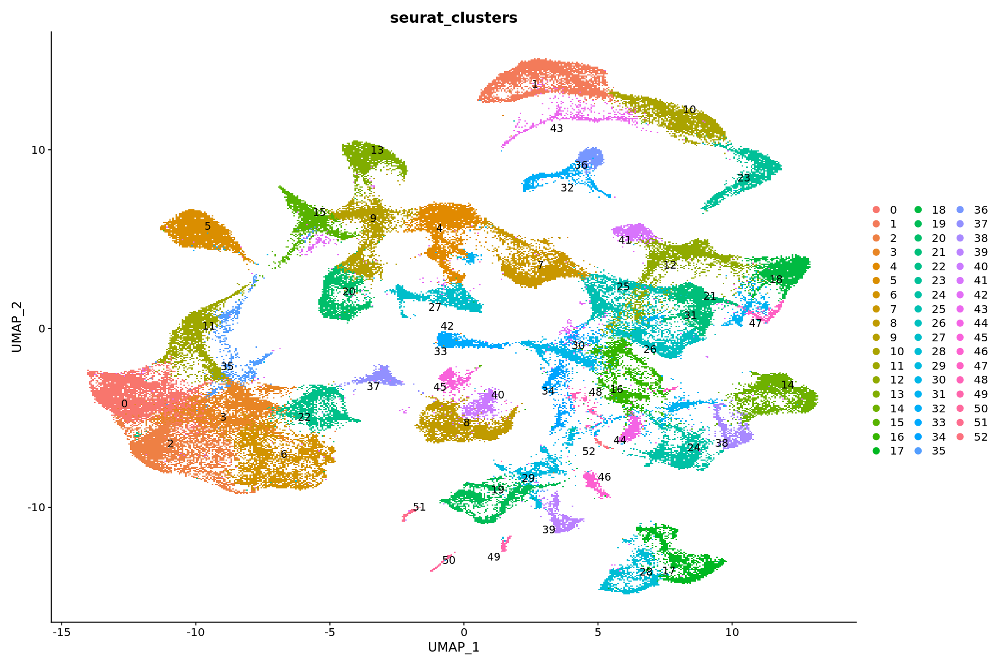

In [5]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "seurat_clusters", label = TRUE,  repel = TRUE)

In [14]:
unique(exp_04@meta.data$predicted.id)

[1] "neuron" "a20"    "a01"    "miss"   "a19"    "a02"    "a07"    "a09"   
 [9] "a06"    "a11"    "a10"    "a08"    "a12"    "a05"    "a03"    "a04"

In [26]:
exp_01 = subset(x = exp_04, subset = predicted.id == 'neuron')
unique(exp_01@meta.data$predicted.id)

[1] "neuron"

In [27]:
exp_02 = subset(x = exp_04, subset = predicted.id == 'miss')
unique(exp_02@meta.data$predicted.id)

[1] "miss"

In [30]:
head(exp_02@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,Cage,Arm,Group,Genotype,BW,DBW,pool,predicted.id,prediction.score.max,labels
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<chr>,<dbl>,<fct>
TTATTGCTCTTCGACC_1,SI-TT-F2,50302,7557,SI-TT-F2,541,7,D705,9199,3619,41103,⋯,6,2,HFD-3d,wt,30.59,0.95,SI-TT-F2,miss,0.5017375,a08
TGGTTAGAGACCTCAT_1,SI-TT-F2,49929,7712,SI-TT-F2,192,7,D705,9096,3522,40833,⋯,7,2,Chow,wt,27.98,NA,SI-TT-F2,miss,0.8774973,neuron-a12
ATCCACCAGCGTTCAT_1,SI-TT-F2,32482,6434,SI-TT-F2,658,7,D705,6269,2759,26213,⋯,6,2,HFD-3d,wt,30.59,0.95,SI-TT-F2,miss,0.5911650,neuron-a12
GTGCTGGAGGCTCTCG_1,SI-TT-F2,31035,6352,SI-TT-F2,273,7,D705,5678,2532,25357,⋯,5,2,HFD-7d,wt,27.02,1.34,SI-TT-F2,miss,0.6423672,neuron-a12
GCTACCTAGAATACAC_1,SI-TT-F2,29437,6114,SI-TT-F2,165,7,D705,6151,2526,23286,⋯,7,2,Chow,wt,27.98,NA,SI-TT-F2,miss,0.5972535,a07
TACCGAAGTTCTCGTC_1,SI-TT-F2,30586,6302,SI-TT-F2,213,7,D705,5300,2573,25286,⋯,7,2,Chow,wt,27.98,NA,SI-TT-F2,miss,0.5287061,a07


In [28]:
exp_03 = merge(exp_01, exp_02)
unique(exp_03@meta.data$predicted.id)

[1] "neuron" "miss"

In [29]:
head(exp_03@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,Cage,Arm,Group,Genotype,BW,DBW,pool,predicted.id,prediction.score.max,labels
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<chr>
CATACAGTCCACTTCG_1,SI-TT-F2,84676,8447,SI-TT-F2,284,7,D705,13534,4282,71142,⋯,7,2,Chow,wt,27.98,NA,SI-TT-F2,neuron,1,neuron
CAACAACAGTATTGCC_1,SI-TT-F2,63963,7484,SI-TT-F2,639,7,D705,10058,3810,53905,⋯,6,2,HFD-3d,wt,30.59,0.95,SI-TT-F2,neuron,1,neuron
AGATCCATCACGACTA_1,SI-TT-F2,69795,7878,SI-TT-F2,406,7,D705,11152,3887,58643,⋯,1,1,Leptin,wt,26.45,-0.23,SI-TT-F2,neuron,1,neuron
CTGAGGCAGTACGAGC_1,SI-TT-F2,66558,8270,SI-TT-F2,388,7,D705,12163,4200,54395,⋯,1,1,Leptin,wt,26.45,-0.23,SI-TT-F2,neuron,1,neuron
CAGATCAAGTATAGGT_1,SI-TT-F2,65686,7734,SI-TT-F2,285,7,D705,10691,3689,54995,⋯,3025,3,GqPlus,GqPlus,30.72,NA,SI-TT-F2,neuron,1,neuron
CTCATCGAGTATCTGC_1,SI-TT-F2,73501,8172,SI-TT-F2,359,7,D705,13988,3810,59513,⋯,3025,3,GqPlus,GqPlus,30.72,NA,SI-TT-F2,neuron,1,neuron


In [23]:
exp_01 = subset(x = exp_04, subset = predicted.id != 'neuron')
unique(exp_01@meta.data$predicted.id)

[1] "a20"  "a01"  "miss" "a19"  "a02"  "a07"  "a09"  "a06"  "a11"  "a10" 
[11] "a08"  "a12"  "a05"  "a03"  "a04"

In [24]:
exp_01 = subset(x = exp_01, subset = predicted.id == c('neuron', 'miss'))
unique(exp_01@meta.data$predicted.id)

Warning message in predicted.id == c("neuron", "miss"):
“longer object length is not a multiple of shorter object length”


[1] "miss"

In [34]:
obj = qs::qread('_targets/objects/exp_labelled_neuron')
obj

An object of class Seurat 
109061 features across 22613 samples within 4 assays 
Active assay: SCT (25106 features, 3000 variable features)
 3 other assays present: RNA, spliced, unspliced
 2 dimensional reductions calculated: pca, umap

In [35]:
names(obj@meta.data)

[1] "orig.ident"                    "nCount_RNA"                   
 [3] "nFeature_RNA"                  "Index.10x"                    
 [5] "nCount_HTO"                    "nFeature_HTO"                 
 [7] "Index.HTO"                     "nCount_spliced"               
 [9] "nFeature_spliced"              "nCount_unspliced"             
[11] "nFeature_unspliced"            "HTO_mcl_maxID"                
[13] "HTO_mcl_secondID"              "HTO_mcl_margin"               
[15] "HTO_mcl_classification"        "HTO_mcl_classification.global"
[17] "hash.mcl.ID"                   "doublet"                      
[19] "predicted_dub_std"             "predicted_dub_cut"            
[21] "predicted_dub_all"             "nCount_SCT"                   
[23] "nFeature_SCT"                  "SCT_snn_res.0.8"              
[25] "seurat_clusters"               "Sample"                       
[27] "Cage"                          "Arm"                          
[29] "Group"                         "Genotype"                     
[31] "BW"                            "DBW"                          
[33] "pool"                          "predicted.id"                 
[35] "prediction.score.max"          "labels"

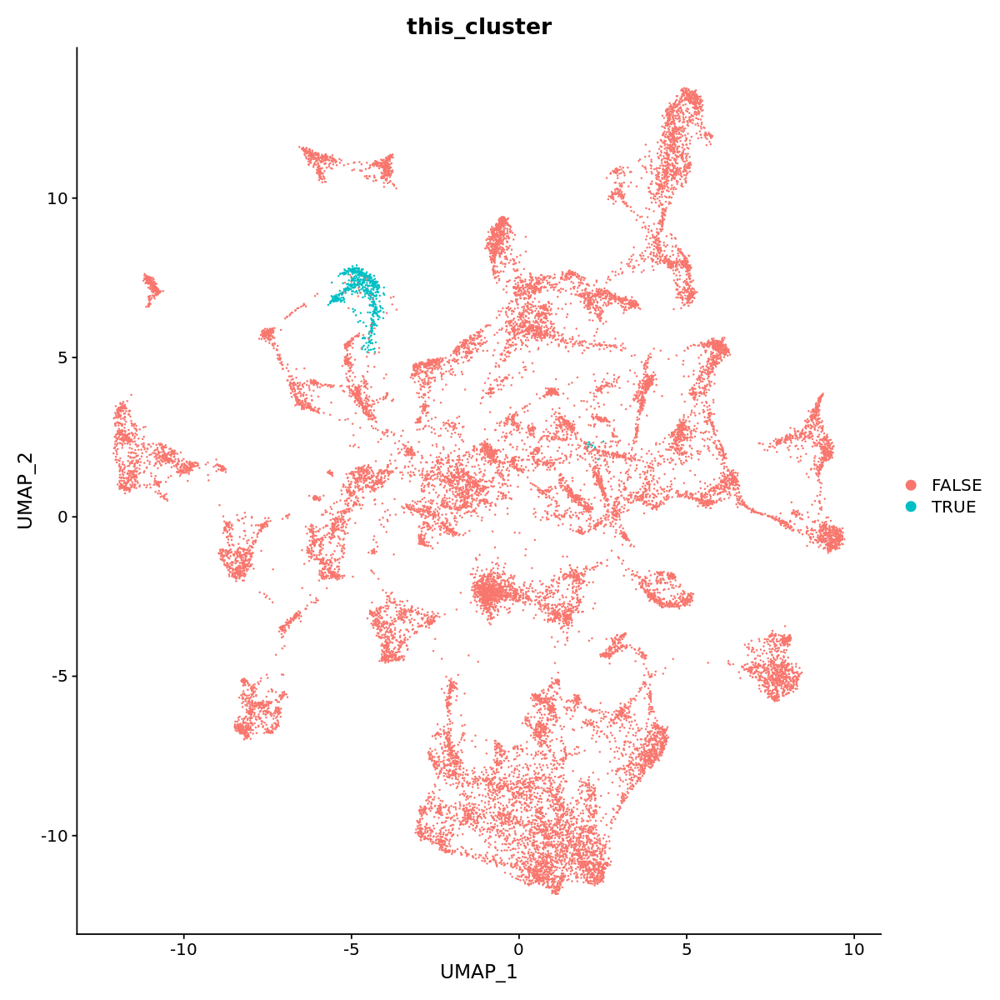

In [36]:
obj@meta.data$this_cluster = obj@meta.data$seurat_clusters == 14
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "this_cluster", label = FALSE)



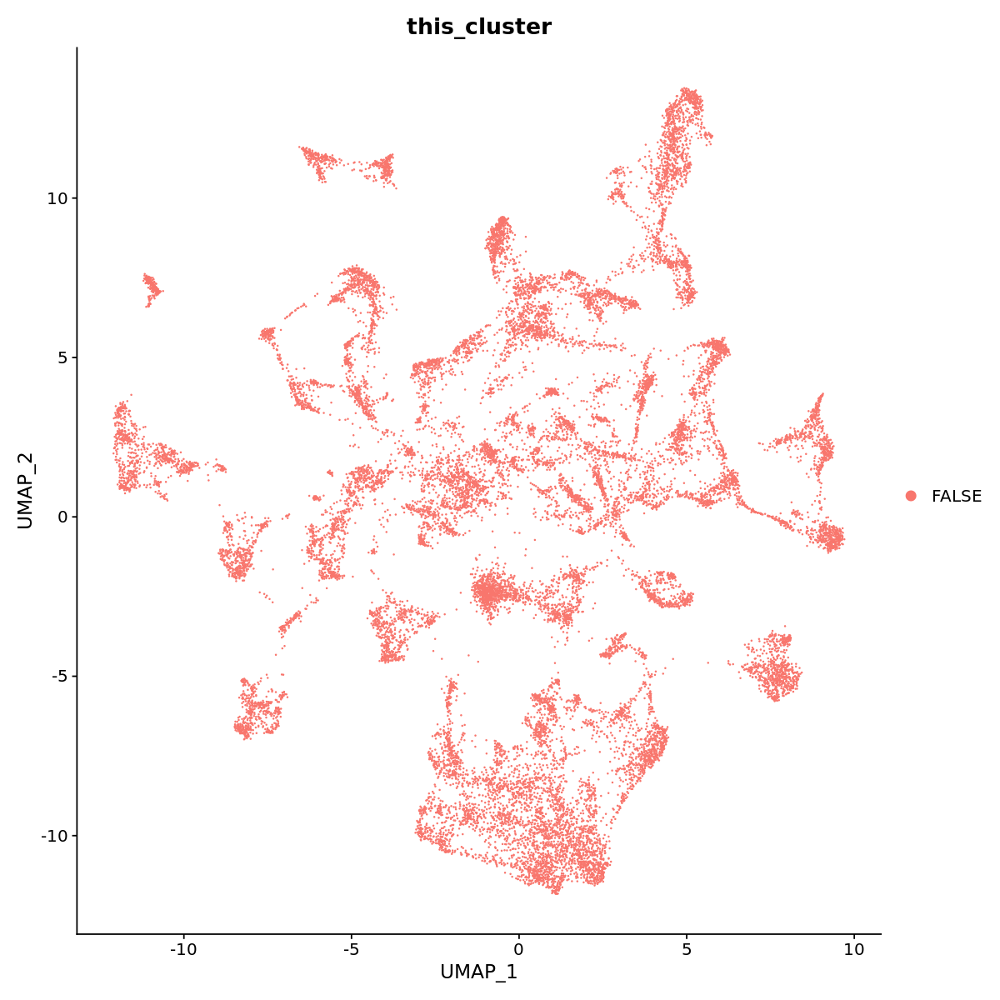

In [37]:
obj@meta.data$this_cluster = obj@meta.data$labels == 14
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "this_cluster", label = FALSE)



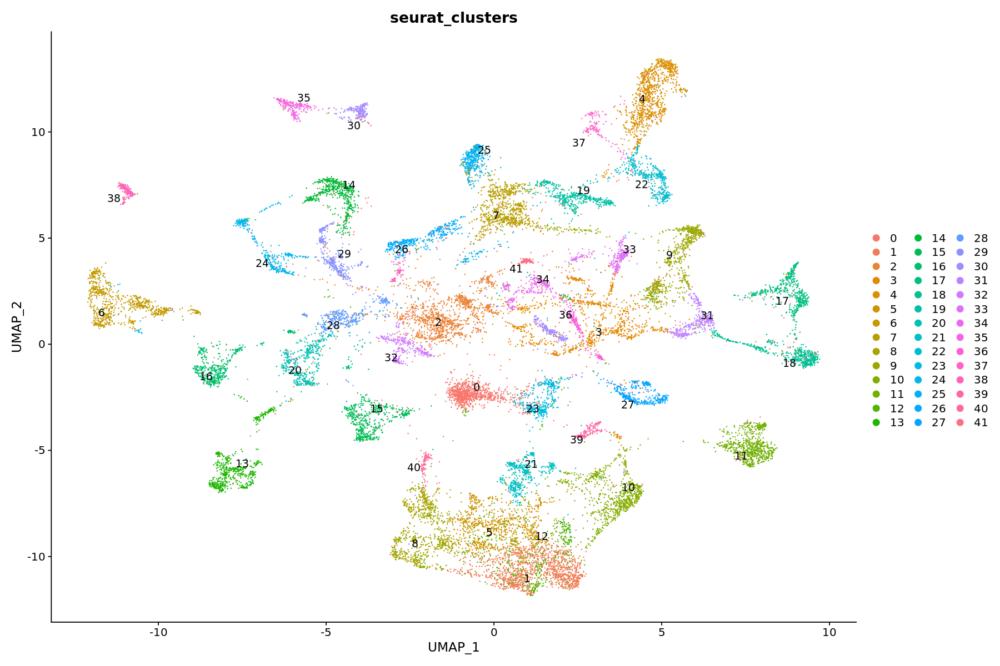

In [38]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "seurat_clusters", label = TRUE,  repel = TRUE)

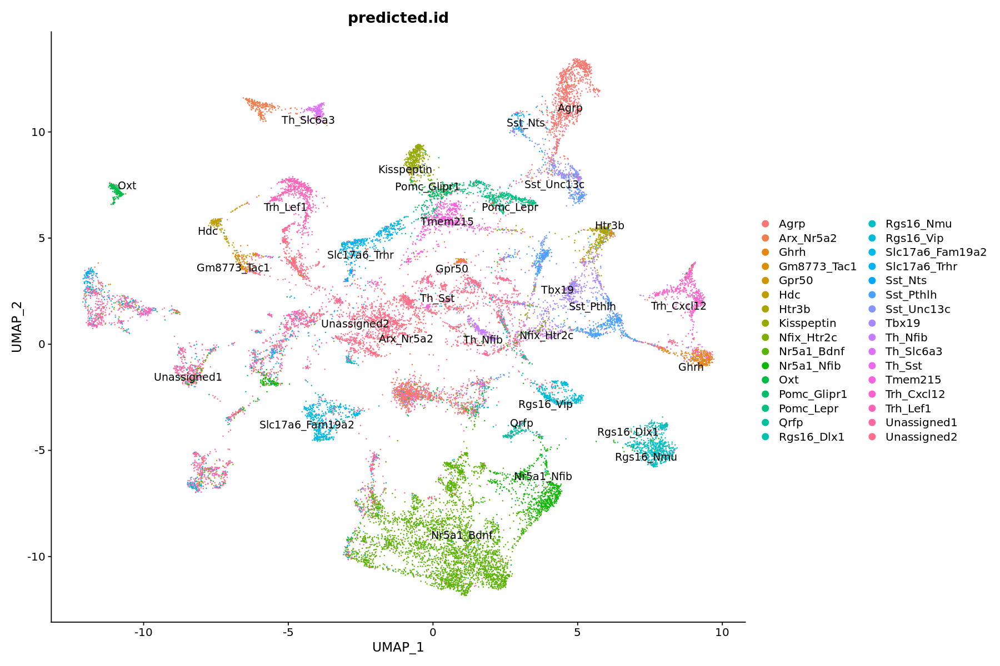

In [39]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "predicted.id", label = TRUE,  repel = TRUE)

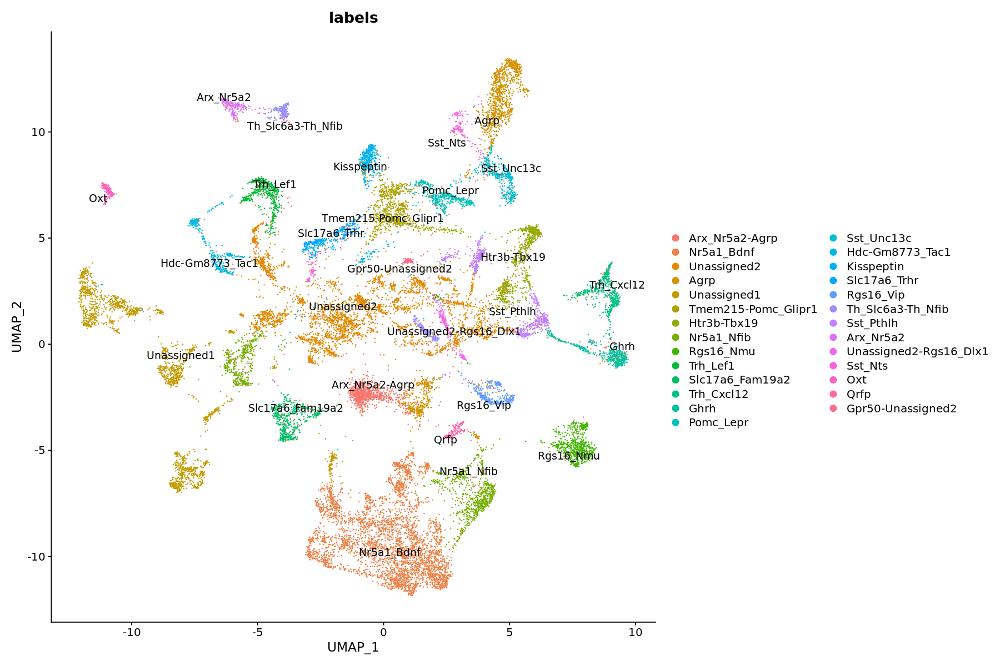

In [40]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "labels", label = TRUE,  repel = TRUE)

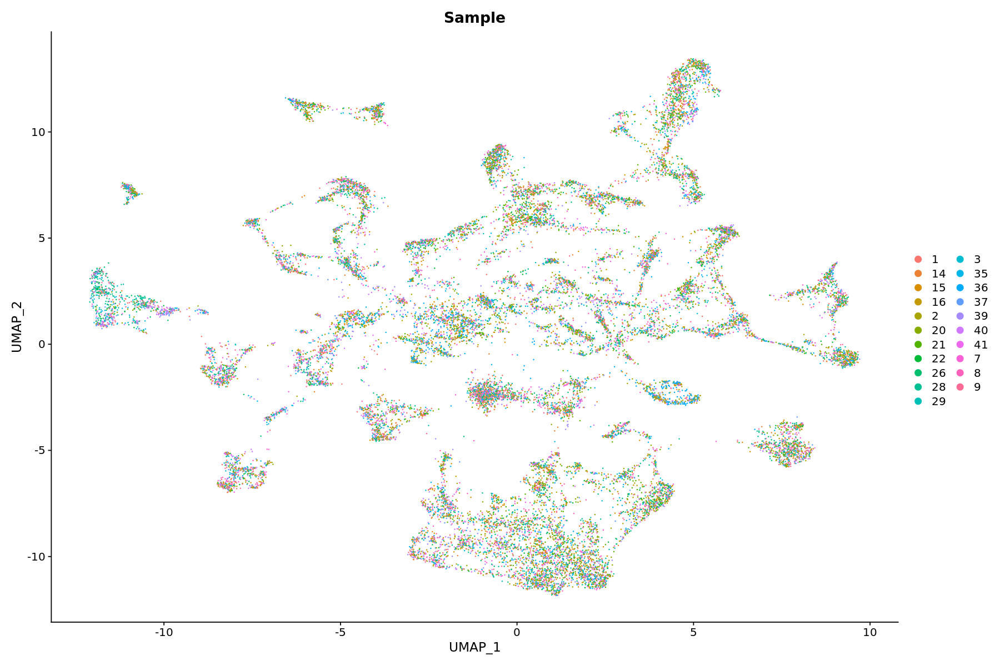

In [41]:
options(repr.plot.width=15, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "Sample")

In [42]:
obj@meta.data$condition <- stringr::str_split(obj@meta.data$hash.mcl.ID, pattern='-', n=2, simplify=TRUE)[,2]

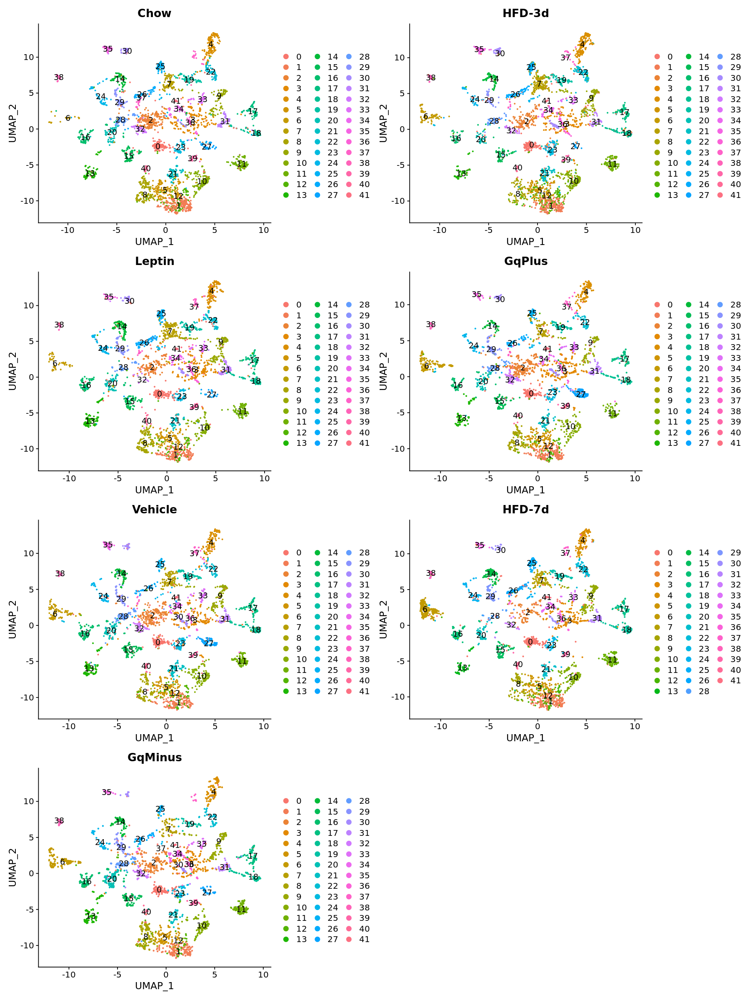

In [43]:
obj_list <- SplitObject(obj, split.by = "condition")
plot.list <- lapply(X = obj_list, FUN = function(x) {
    DimPlot(x, reduction = "umap", group.by = "seurat_clusters", , label = TRUE) + ggplot2::ggtitle(unique(x$condition))
})
options(repr.plot.width=15, repr.plot.height=20)
patchwork::wrap_plots(plot.list, ncol=2)

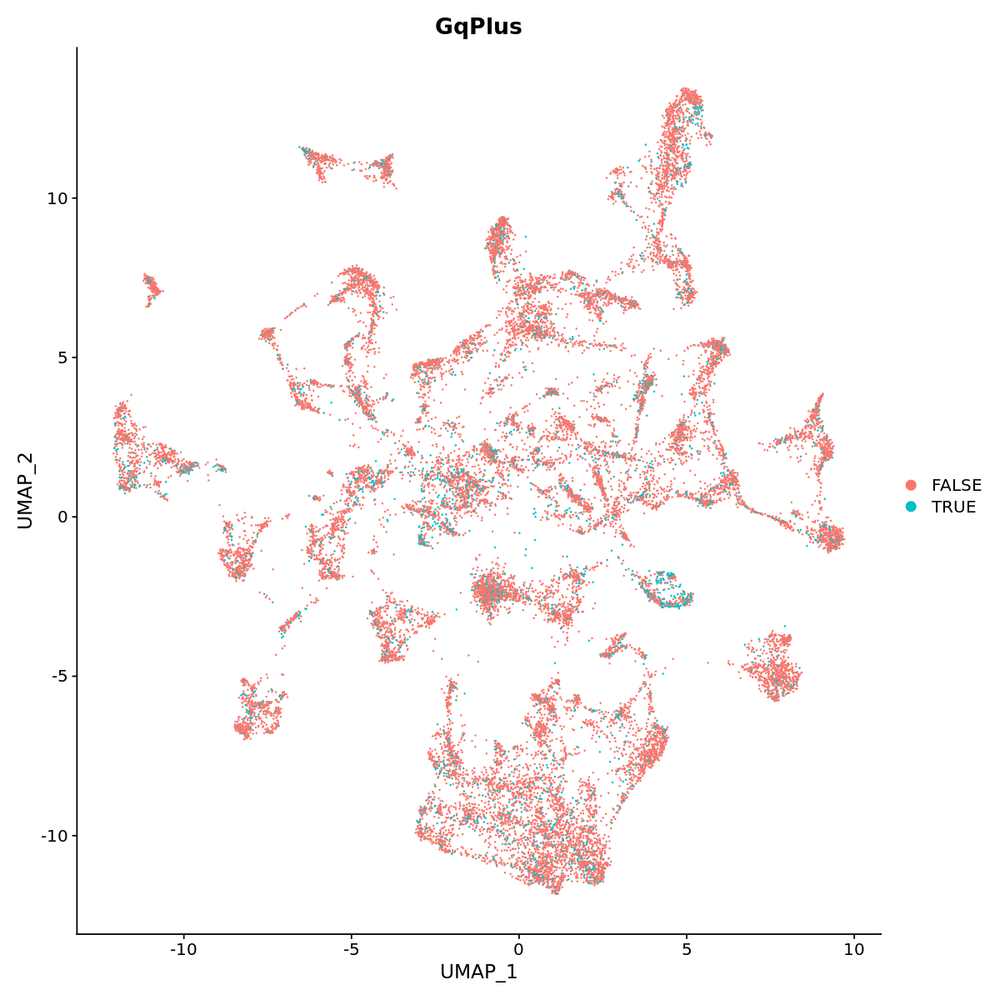

In [44]:
obj@meta.data$GqPlus = obj@meta.data$Group == 'GqPlus'
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(obj, reduction = "umap", group.by = "GqPlus", label = FALSE)



In [45]:
obj_list <- SplitObject(obj, split.by = "condition")
plot.list <- lapply(X = obj_list, FUN = function(x) {
    DimPlot(x, reduction = "umap", group.by = "clust_all", , label = TRUE) + ggplot2::ggtitle(unique(x$condition))
})
options(repr.plot.width=15, repr.plot.height=20)
patchwork::wrap_plots(plot.list, ncol=2)

ERROR: Error: Cannot find 'clust_all' in this Seurat object


In [ ]:
DefaultAssay(obj) <- "SCT"
name = '13_vs_11_9'
markers = FindMarkers(object=obj, ident="seurat_clusters", ident.1=13, ident.2=c(11,9))
top_markers = markers %>% filter(avg_log2FC > 0)
top_markers = rownames(top_markers)[1:24]
# top_markers = rownames(top_markers)[1:12]
# bottom_markers = markers %>% filter(avg_log2FC < 0)
# bottom_markers = rownames(bottom_markers)[1:12]
# display_genes = c(top_markers, bottom_markers)
display_genes = top_markers
DefaultAssay(obj) <- "RNA"
fp = FeaturePlot(obj,
            features = display_genes,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           ncol=4,
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp = fp & theme_bw(base_size=10) & theme(axis.title.x=element_blank(),
                   axis.text.x=element_blank(),
                   axis.ticks.x=element_blank(),
                   axis.title.y=element_blank(),
                   axis.text.y=element_blank(),
                   axis.ticks.y=element_blank(),
                   legend.key.width=unit(0.2,"cm"),
                   legend.key.height=unit(0.5,"cm"),
                    legend.text=element_text(size=5))
ggsave(paste0(name, '.pdf'), plot=fp, device='pdf', height=297, width=210, units='mm', limitsize=FALSE)
write.csv(markers, paste0(name, '.csv'))

In [ ]:
DefaultAssay(obj) <- "SCT"
name = '11_9_vs_13'
markers = FindMarkers(object=obj, ident="seurat_clusters", ident.1=c(11,9), ident.2=13)
top_markers = markers %>% filter(avg_log2FC > 0)
top_markers = rownames(top_markers)[1:24]
# top_markers = rownames(top_markers)[1:12]
# bottom_markers = markers %>% filter(avg_log2FC < 0)
# bottom_markers = rownames(bottom_markers)[1:12]
# display_genes = c(top_markers, bottom_markers)
display_genes = top_markers
DefaultAssay(obj) <- "RNA"
fp = FeaturePlot(obj,
            features = display_genes,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           ncol=4,
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp = fp & theme_bw(base_size=10) & theme(axis.title.x=element_blank(),
                   axis.text.x=element_blank(),
                   axis.ticks.x=element_blank(),
                   axis.title.y=element_blank(),
                   axis.text.y=element_blank(),
                   axis.ticks.y=element_blank(),
                   legend.key.width=unit(0.2,"cm"),
                   legend.key.height=unit(0.5,"cm"),
                    legend.text=element_text(size=5))
ggsave(paste0(name, '.pdf'), plot=fp, device='pdf', height=297, width=210, units='mm', limitsize=FALSE)
write.csv(markers, paste0(name, '.csv'))

In [ ]:
DefaultAssay(obj) <- "SCT"
name = '13_vs_11_9_5_3'
markers = FindMarkers(object=obj, ident="seurat_clusters", ident.1=13, ident.2=c(11, 9, 5, 3))
top_markers = markers %>% filter(avg_log2FC > 0)
top_markers = rownames(top_markers)[1:24]
# top_markers = rownames(top_markers)[1:12]
# bottom_markers = markers %>% filter(avg_log2FC < 0)
# bottom_markers = rownames(bottom_markers)[1:12]
# display_genes = c(top_markers, bottom_markers)
display_genes = top_markers
DefaultAssay(obj) <- "RNA"
fp = FeaturePlot(obj,
            features = display_genes,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           ncol=4,
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp = fp & theme_bw(base_size=10) & theme(axis.title.x=element_blank(),
                   axis.text.x=element_blank(),
                   axis.ticks.x=element_blank(),
                   axis.title.y=element_blank(),
                   axis.text.y=element_blank(),
                   axis.ticks.y=element_blank(),
                   legend.key.width=unit(0.2,"cm"),
                   legend.key.height=unit(0.5,"cm"),
                    legend.text=element_text(size=5))
ggsave(paste0(name, '.pdf'), plot=fp, device='pdf', height=297, width=210, units='mm', limitsize=FALSE)
write.csv(markers, paste0(name, '.csv'))

In [ ]:
DefaultAssay(obj) <- "SCT"
name = '11_9_5_3_vs_13'
markers = FindMarkers(object=obj, ident="seurat_clusters", ident.1=c(11, 9, 5, 3), ident.2=13)
top_markers = markers %>% filter(avg_log2FC > 0)
top_markers = rownames(top_markers)[1:24]
# top_markers = rownames(top_markers)[1:12]
# bottom_markers = markers %>% filter(avg_log2FC < 0)
# bottom_markers = rownames(bottom_markers)[1:12]
# display_genes = c(top_markers, bottom_markers)
display_genes = top_markers
DefaultAssay(obj) <- "RNA"
fp = FeaturePlot(obj,
            features = display_genes,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           ncol=4,
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp = fp & theme_bw(base_size=10) & theme(axis.title.x=element_blank(),
                   axis.text.x=element_blank(),
                   axis.ticks.x=element_blank(),
                   axis.title.y=element_blank(),
                   axis.text.y=element_blank(),
                   axis.ticks.y=element_blank(),
                   legend.key.width=unit(0.2,"cm"),
                   legend.key.height=unit(0.5,"cm"),
                    legend.text=element_text(size=5))
ggsave(paste0(name, '.pdf'), plot=fp, device='pdf', height=297, width=210, units='mm', limitsize=FALSE)
write.csv(markers, paste0(name, '.csv'))

In [ ]:
DefaultAssay(obj) <- "SCT"
cluster_id = 13
other_clusters = setdiff(obj@meta.data$seurat_clusters, c(c(11, 9, 5, 3, 13)))
name = paste0(cluster_id, '_vs_nontanyctes')
markers = FindMarkers(object=obj, ident="seurat_clusters", ident.1=13, ident.2=other_clusters)
top_markers = markers %>% filter(avg_log2FC > 0)
top_markers = rownames(top_markers)[1:24]
# top_markers = rownames(top_markers)[1:12]
# bottom_markers = markers %>% filter(avg_log2FC < 0)
# bottom_markers = rownames(bottom_markers)[1:12]
# display_genes = c(top_markers, bottom_markers)
display_genes = top_markers
DefaultAssay(obj) <- "RNA"
fp = FeaturePlot(obj,
            features = display_genes,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           ncol=4,
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp = fp & theme_bw(base_size=10) & theme(axis.title.x=element_blank(),
                   axis.text.x=element_blank(),
                   axis.ticks.x=element_blank(),
                   axis.title.y=element_blank(),
                   axis.text.y=element_blank(),
                   axis.ticks.y=element_blank(),
                   legend.key.width=unit(0.2,"cm"),
                   legend.key.height=unit(0.5,"cm"),
                    legend.text=element_text(size=5))
ggsave(paste0(name, '.pdf'), plot=fp, device='pdf', height=297, width=210, units='mm', limitsize=FALSE)
write.csv(markers, paste0(name, '.csv'))

In [ ]:
DefaultAssay(obj) <- "SCT"
cluster_id = 11
other_clusters = setdiff(obj@meta.data$seurat_clusters, c(c(11, 9, 5, 3, 13)))
name = paste0(cluster_id, '_vs_nontanyctes')
markers = FindMarkers(object=obj, ident="seurat_clusters", ident.1=cluster_id, ident.2=other_clusters)
top_markers = markers %>% filter(avg_log2FC > 0)
top_markers = rownames(top_markers)[1:24]
# top_markers = rownames(top_markers)[1:12]
# bottom_markers = markers %>% filter(avg_log2FC < 0)
# bottom_markers = rownames(bottom_markers)[1:12]
# display_genes = c(top_markers, bottom_markers)
display_genes = top_markers
DefaultAssay(obj) <- "RNA"
fp = FeaturePlot(obj,
            features = display_genes,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           ncol=4,
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp = fp & theme_bw(base_size=10) & theme(axis.title.x=element_blank(),
                   axis.text.x=element_blank(),
                   axis.ticks.x=element_blank(),
                   axis.title.y=element_blank(),
                   axis.text.y=element_blank(),
                   axis.ticks.y=element_blank(),
                   legend.key.width=unit(0.2,"cm"),
                   legend.key.height=unit(0.5,"cm"),
                    legend.text=element_text(size=5))
ggsave(paste0(name, '.pdf'), plot=fp, device='pdf', height=297, width=210, units='mm', limitsize=FALSE)
write.csv(markers, paste0(name, '.csv'))

In [ ]:
paste0(c(1,2))

In [ ]:
markers = c('Adm', 'Rax', 'Crym',
            'Ppp1r1b', 'Vim', 'Rax', 'Dio2', 'Slc16a2',
            'Cldn1', 'Vegf', 'Cdh2', 'Cav1', "Slc2a1",
            'Sox2', 'Fgf10', 'Blbp', 'Musashi1', 'Fgfr1',
            'Cntfr', 'Slc1a3', 'Slc16a1', 'Slc16a4', 'Gja1',
            'Fgf18', 'Prss56', 'Col23a1', 'Cd59a', 'Slc17a8', 'Vcan')


In [ ]:
head(rownames(obj))

In [ ]:
length(intersect(markers, rownames(obj)))

In [ ]:
DefaultAssay(obj) <- "SCT"
name = 'tanycyte_markers_langlet'
markers = c('Adm', 'Rax', 'Crym',
            'Ppp1r1b', 'Vim', 'Rax', 'Dio2', 'Slc16a2',
            'Cldn1', 'Vegf', 'Cdh2', 'Cav1', "Slc2a1",
            'Sox2', 'Fgf10', 'Blbp', 'Musashi1', 'Fgfr1',
            'Cntfr', 'Slc1a3', 'Slc16a1', 'Slc16a4', 'Gja1',
            'Fgf18', 'Prss56', 'Col23a1', 'Cd59a', 'Slc17a8', 'Vcan',
            'Frzb', 'Penk', 'Vegfa', 'Vegfb', 'Vegfc', 'Sprr1a', 'Ocln', 'Ptn')
markers = unique(markers)
# top_markers = rownames(top_markers)[1:12]
# bottom_markers = markers %>% filter(avg_log2FC < 0)
# bottom_markers = rownames(bottom_markers)[1:12]
# display_genes = c(top_markers, bottom_markers)
display_genes = markers
# DefaultAssay(obj) <- "RNA"
fp = FeaturePlot(obj,
            features = display_genes,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           ncol=4,
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp = fp & theme_bw(base_size=10) & theme(axis.title.x=element_blank(),
                   axis.text.x=element_blank(),
                   axis.ticks.x=element_blank(),
                   axis.title.y=element_blank(),
                   axis.text.y=element_blank(),
                   axis.ticks.y=element_blank(),
                   legend.key.width=unit(0.2,"cm"),
                   legend.key.height=unit(0.5,"cm"),
                    legend.text=element_text(size=5))
ggsave(paste0(name, '.pdf'), plot=fp, device='pdf', height=297, width=210, units='mm', limitsize=FALSE)

In [ ]:
DefaultAssay(obj) <- "SCT"
name = 'tanycyte_markers_campbell'
markers = c("Cd59a", "Crym", "Vcan", "Frzb", "Penk", "Col25a1", "Adm", 'Sprr1a',
"Stoml3",
"Ctgf",
"Rgs7bp",
"Adm",
"Rgcc",
"Igfbp5",
"Col25a1",
"Mest",
"Fndc3c1",
"Scn7a",
"Fgf10",
"Six6",
"Penk",
"Frzb",
"Rlbp1",
"Gria2",
"Nell2",
"P3h2",
"Ephb1",
"Nr2e1",
"Vcan",
"Slc7a11",
"Gfap",
"Agt",
"Tgfb2",
"Slc1a2",
"Pltp",
"Tm4sf1",
"Pcp4l1",
"Tmem212",
"Ccdc153", 'Adm', 'Rax', 'Crym')
markers = unique(markers)
# top_markers = rownames(top_markers)[1:12]
# bottom_markers = markers %>% filter(avg_log2FC < 0)
# bottom_markers = rownames(bottom_markers)[1:12]
# display_genes = c(top_markers, bottom_markers)
display_genes = markers
# DefaultAssay(obj) <- "RNA"
fp = FeaturePlot(obj,
            features = display_genes,
           pt.size=5,
           order=TRUE,
           min.cutoff="q01",
           max.cutoff="q99",
           ncol=4,
           raster=TRUE,
           raster.dpi=c(1024, 1024)
           )
fp = fp & theme_bw(base_size=10) & theme(axis.title.x=element_blank(),
                   axis.text.x=element_blank(),
                   axis.ticks.x=element_blank(),
                   axis.title.y=element_blank(),
                   axis.text.y=element_blank(),
                   axis.ticks.y=element_blank(),
                   legend.key.width=unit(0.2,"cm"),
                   legend.key.height=unit(0.5,"cm"),
                    legend.text=element_text(size=5))
ggsave(paste0(name, '.pdf'), plot=fp, device='pdf', height=297, width=210, units='mm', limitsize=FALSE)

In [ ]:
sessionInfo()